In [1023]:
import MLP_Olaf as ML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy
import time
import seaborn as sns

In [1024]:
#\usepackage[utf8]{inputenc}

# Wstęp

Celem tego sprawozdania jest przeprowadzenie testów mojej implementacji sieci neuronowej.
Będzie parę eksperymentów. Każdy eksperyment bedzie opisany przez warunki eksperymentu, hipotezę, wyniki i wnioski. Z założenia wszystkie dane na których przeprowadzam eksperymenty są zestandaryzowane. Poza tym dla problemów klasyfikacji dane są w kodowaniu "one-hot". Podczas eksperymentów sieci będą startować z tymi samymi wagami jeśli mają tyle samo neuronów w każdej warstwie dla danego zbioru. Wagi sieci będą inicjowane losowo, jednostajnie z przedziału [-1, 1]. Dla problemów klasyfikacji używany jest softmax na ostatniej warstwie. Dla problemów klasyfikacji liczymy accuracy i cross entropy, ale trenujemy używając cross entropy. Dla problemów regresji używamy MSE.

In [1025]:
df=pd.DataFrame(columns=["model_n","problem","dataset","columns_input","columns_output",
                  "rows_train","rows_test","layers","neurons","connections",
                  "L1","L2","regularization","alpha","activation_function",
                         "validate","score_train","score_test","cost_function",
                         "epochs","time","rate","beta","RMSprop","batch"])

In [1026]:
MAX_EPOCH=300

In [1027]:
networks=[]

networks_names=[]

networks_err=[]

np.random.seed(123)

model_n=0

# Eksperyment 1 wpływ ilości warstw i neuronów na uczenie

Zbadamy wpływ ilości warstw i neuronów na proces uczenia. Zastosujemy tradycyjną metodę spadku gradientu, za learning rate biorąc 0.1, a naszą funkcją aktywacji będzie sigmoid. Za stop mamy przekroczenie liczby epok równe 300 lub bewzględną zmianę błędu mniejszą niż 10**-6. Nie używamy batchy. Takie warunki będziemy nazywać "podstawowymi". Będziemy testować następujące architektury: [5],[5,5],[10],[3,4,3],[6,6,6],[3,3,3,3]. Będziemy przeprowadzać testy na zbiorach: xor3, rings5-regular, square-simple i multimodal-small

# Hipoteza: im więcej połączeń miedzy neuronomi tym lepiej, zaś sama liczba neuronów nie jest już tak znacząca

## square-simple

In [1028]:
test = np.loadtxt("mio1/regression/square-simple-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1029]:
test = np.loadtxt("mio1/regression/square-simple-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

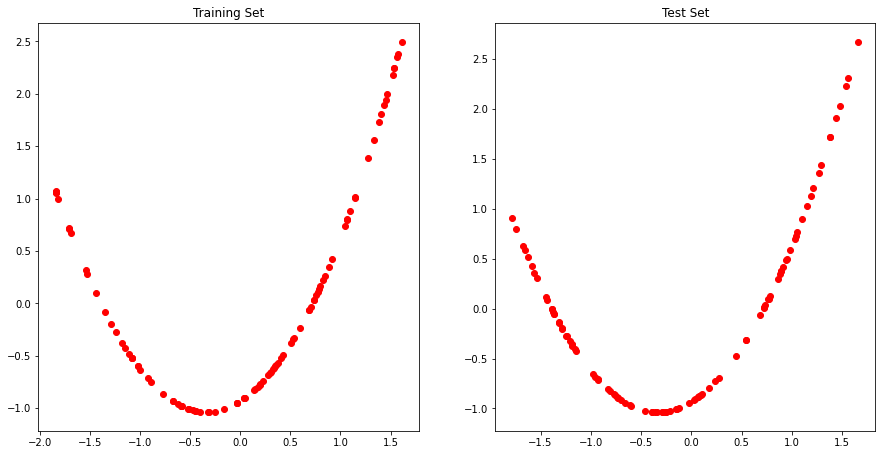

In [1030]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1031]:
for L in [[5],[5,5],[10],[3,4,3],[6,6,6],[3,3,3,3]]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("square-simple-"+str(L))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"square-simple","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)

start error 141.152925317298
end in epoch 300 with error 72.04725316390332
start error 141.7602660028694
end in epoch 300 with error 78.01016788933401
start error 215.07170035823086
end in epoch 300 with error 75.5163568032812
start error 112.13568816118298
end in epoch 300 with error 99.89588735127404
start error 105.1073618447293
end in epoch 300 with error 95.86376579187608
start error 140.38359332244215
end in epoch 31 with error 99.97924718487688


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.533')]

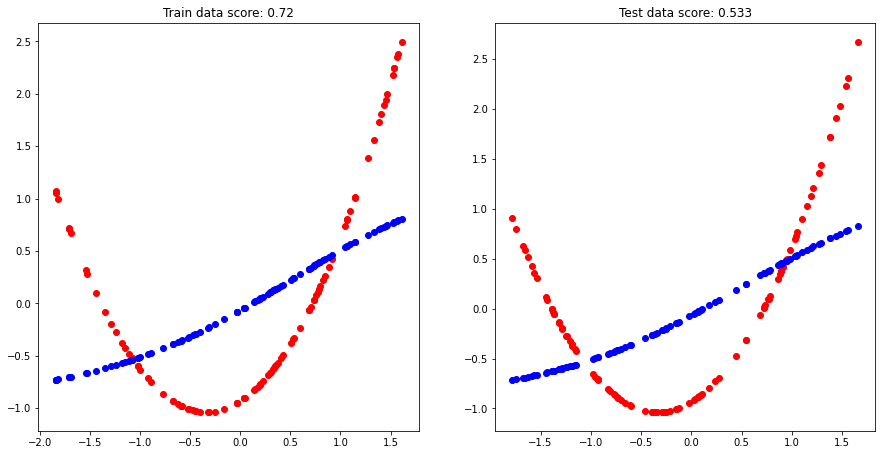

In [1032]:
best=df[df["cost_function"]=="MSE"][-6:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## multimodal-small

In [1033]:
test = np.loadtxt("mio1/regression/multimodal-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1034]:
test = np.loadtxt("mio1/regression/multimodal-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

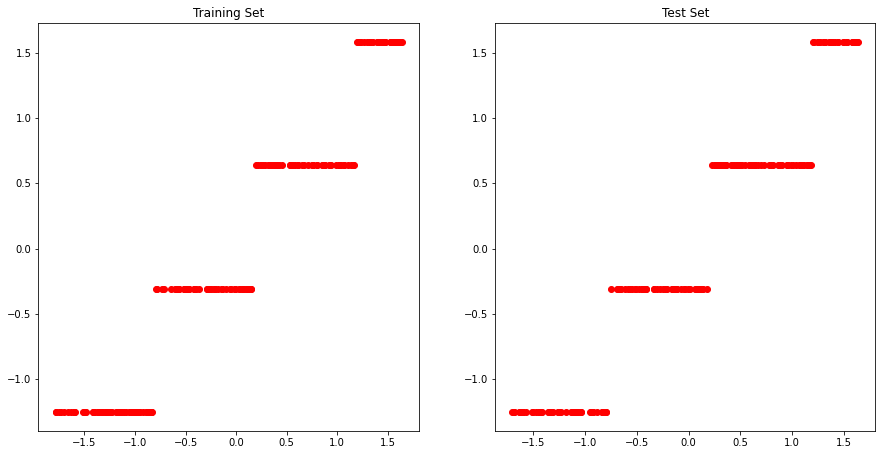

In [1035]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1036]:
for L in [[5],[5,5],[10],[3,4,3],[6,6,6],[3,3,3,3]]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("multimodal-small-"+str(L))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"multimodal-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)

start error 321.7976280230672
end in epoch 300 with error 14.078814840272102
start error 277.4351535695655
end in epoch 300 with error 15.557937009454106
start error 496.9766645074266
end in epoch 300 with error 14.0514778234221
start error 224.31164324151158
end in epoch 300 with error 198.68503216933476
start error 208.52250624934396
end in epoch 300 with error 80.98596436665667
start error 280.700726242659
end in epoch 35 with error 199.90175047874686


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.069')]

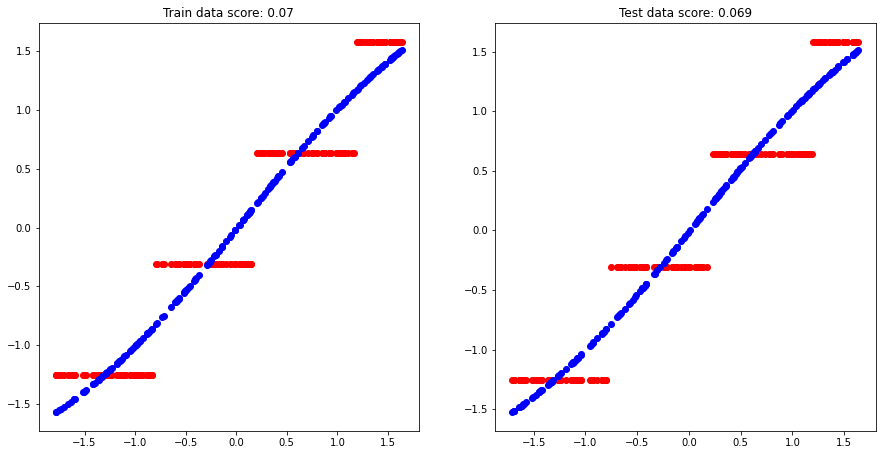

In [1037]:
best=df[df["cost_function"]=="MSE"][-6:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## xor3

In [1038]:
test = np.loadtxt("mio1/classification/xor3-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1039]:
test = np.loadtxt("mio1/classification/xor3-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

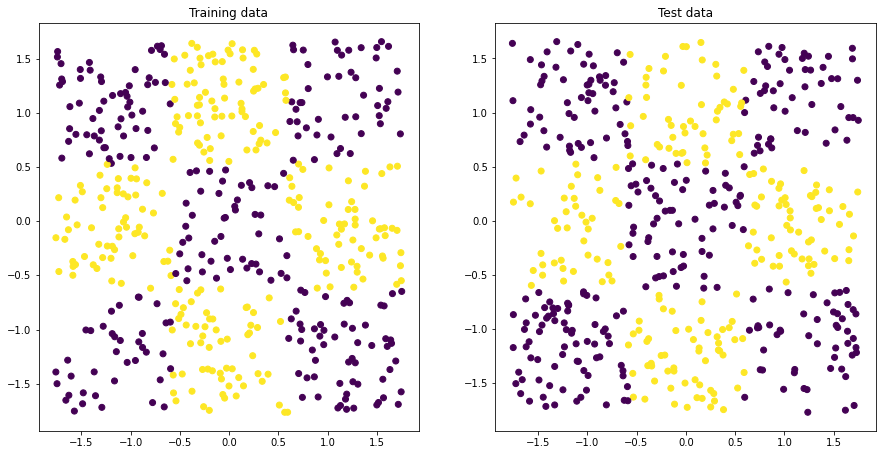

In [1040]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1041]:
for L in [[5],[5,5],[10],[3,4,3],[6,6,6],[3,3,3,3]]:
    mlp_test=ML.MLP_new(2,2,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("xor3-"+str(L))
    
    output_layer=mlp_test.calculate(train_input_layer)
    ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    output_layer=mlp_test.calculate(test_input_layer)
    ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.cross_entropy(train_output_layer,output_layer)
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.cross_entropy(test_output_layer,output_layer)
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    score_train=score_train/rows_train
    score_test=score_test/rows_test
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)
    
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)

start error 359.634163607023
end in epoch 300 with error 346.376880957344
start error 404.57238069293646
end in epoch 47 with error 346.3468742609167
start error 362.6474939315518
end in epoch 300 with error 346.26081310390043
start error 356.07608041516363
end in epoch 44 with error 346.6092070883922
start error 408.2376689183135
end in epoch 39 with error 346.54407719535845
start error 386.4253080942235
end in epoch 60 with error 346.5877569347758


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

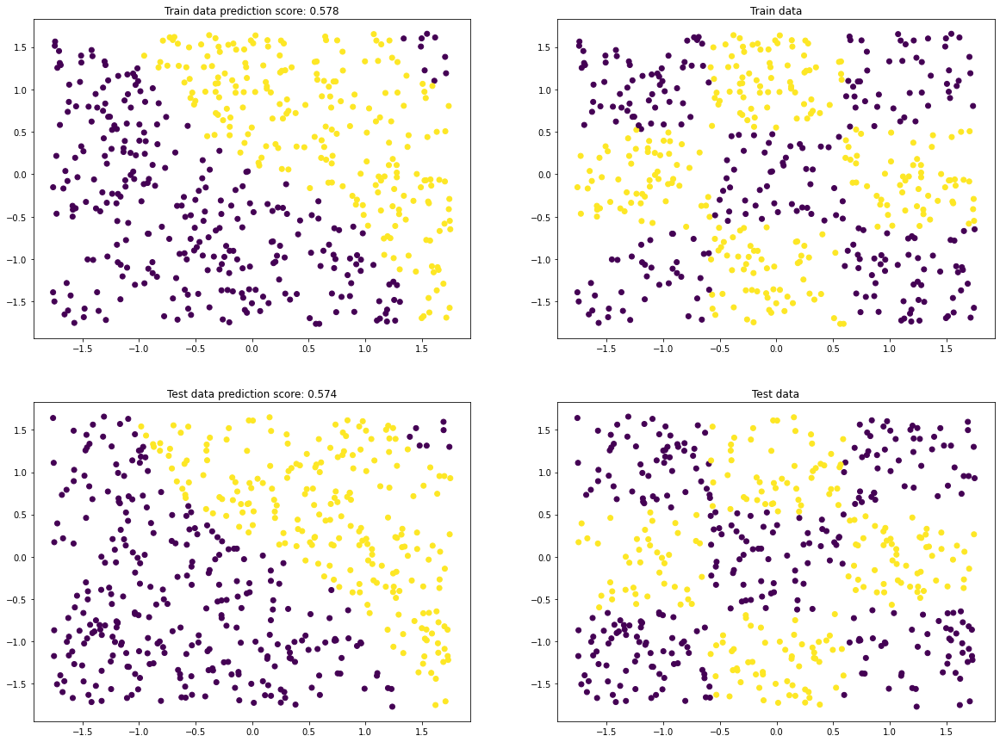

In [1042]:
best=df[df["cost_function"]=="ACC"][-6:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

## rings5-regular

In [1043]:
test = np.loadtxt("mio1/classification/rings5-regular-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1044]:
test = np.loadtxt("mio1/classification/rings5-regular-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

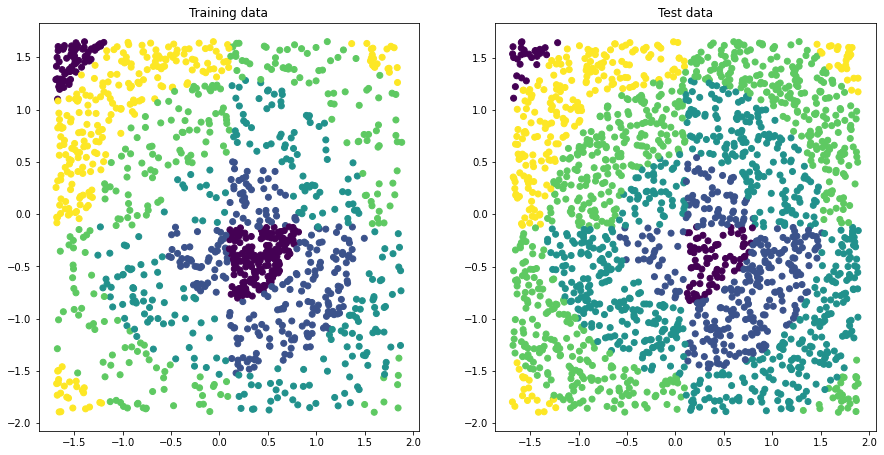

In [1045]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1046]:
for L in [[5],[5,5],[10],[3,4,3],[6,6,6],[3,3,3,3]]:
    mlp_test=ML.MLP_new(2,5,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("rings5-regular-"+str(L))
    
    output_layer=mlp_test.calculate(train_input_layer)
    ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    output_layer=mlp_test.calculate(test_input_layer)
    ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.cross_entropy(train_output_layer,output_layer)
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.cross_entropy(test_output_layer,output_layer)
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    score_train=score_train/rows_train
    score_test=score_test/rows_test
    t=t/(len(er)-1)
    model_n+=1
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-regular","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)
    
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-regular","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":1},ignore_index=True)

start error 2281.41630371979
end in epoch 300 with error 1768.763244334481
start error 2095.7327004394756
end in epoch 300 with error 1992.6508163391595
start error 2178.316031195174
end in epoch 300 with error 1749.137197878424
start error 2143.7797095803935
end in epoch 120 with error 2010.6312889405517
start error 2291.101889313364
end in epoch 300 with error 2008.556519851401
start error 2069.004299068987
end in epoch 109 with error 2011.8437427320835


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

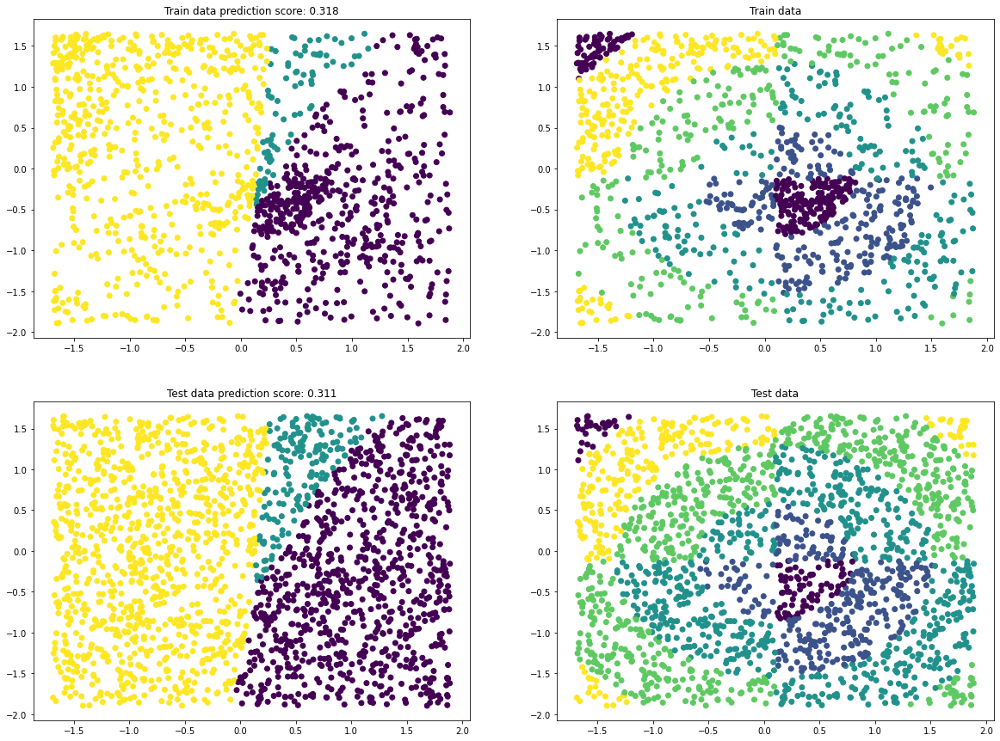

In [1047]:
best=df[df["cost_function"]=="ACC"][-6:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

In [1048]:
df_c=df[df["problem"]=="classification"]

In [1049]:
df_r=df[df["problem"]!="classification"]

## Wykres wyniku od liczby wag

### MSE

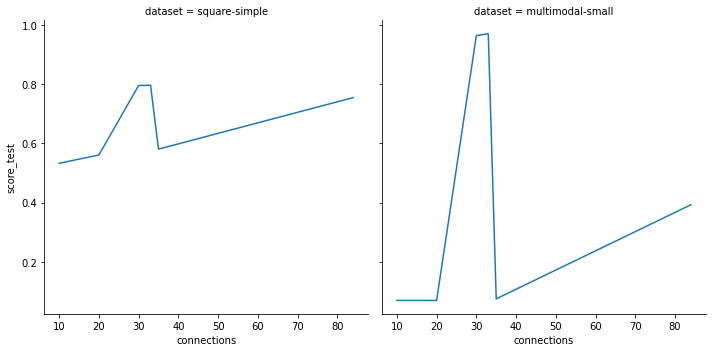

In [1050]:
sns.relplot(x="connections",y="score_test",col="dataset",kind="line",data=df_r)

### Accuracy

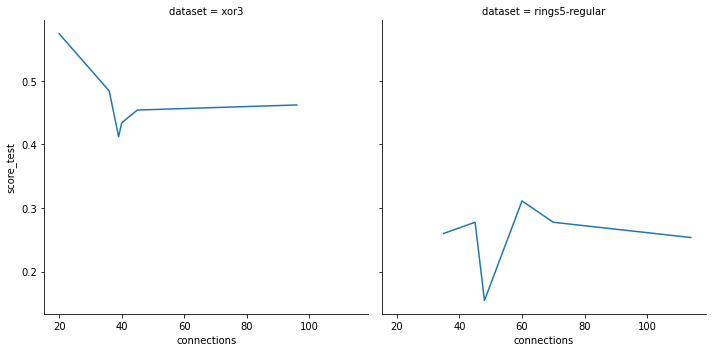

In [1051]:
sns.relplot(x="connections",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="ACC"])

### Entropy

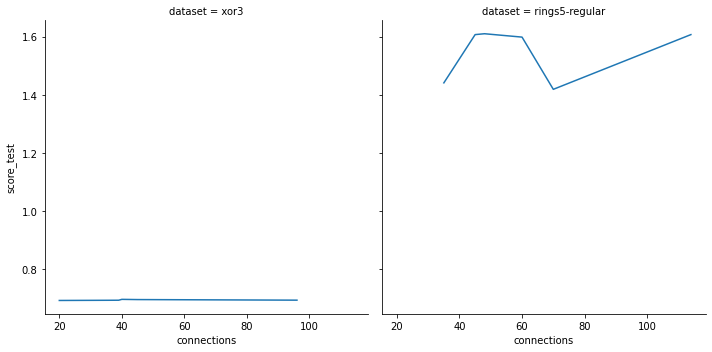

In [1052]:
sns.relplot(x="connections",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="Entropy"])

Ogólnie to mamy obserwację odstającą jest to architektura [3,3,3,3] najwyrażniej architektura która jest długa, ale wąska jest złą architekturą. Po za tym to ilość wag nie ma wpływu tu oczywistego wpływu

## Wykres wyniku od liczby warstw

### MSE

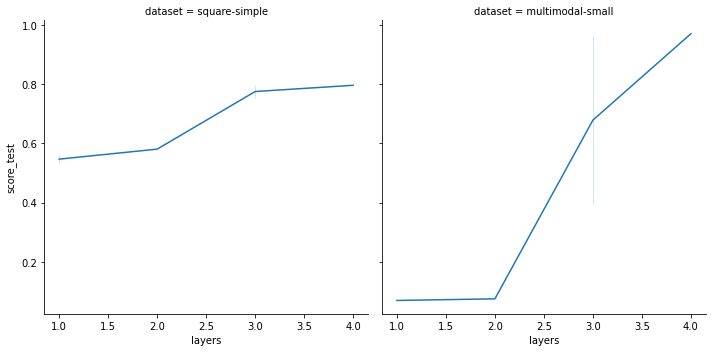

In [1053]:
sns.relplot(x="layers",y="score_test",col="dataset",kind="line",data=df_r)

### Accuracy

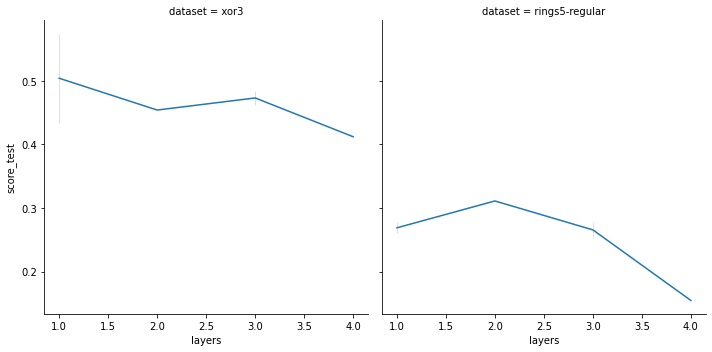

In [1054]:
sns.relplot(x="layers",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="ACC"])

### Entropy

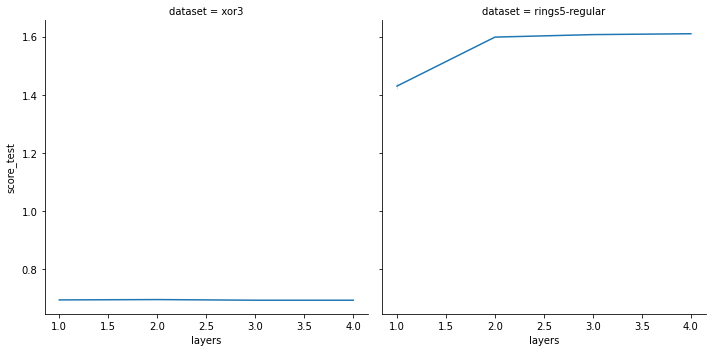

In [1055]:
sns.relplot(x="layers",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="Entropy"])

Ponownie architektura [3,3,3,3] jest złą architekturą. Po za tym to ilość warstw wydaje się mieć ujemny wpływ tzn im więcej warstw tym gorzej

## Wykres wyniku od liczby neuronów

### MSE

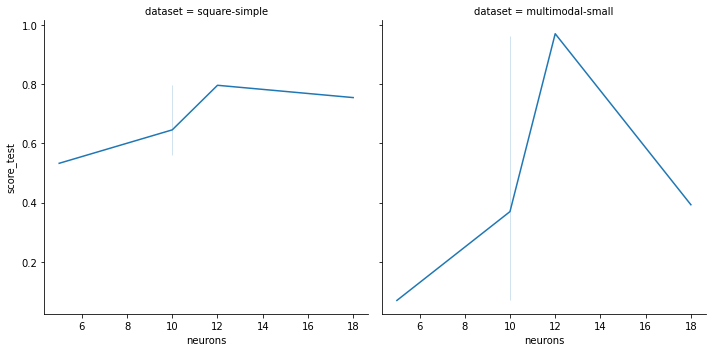

In [1056]:
sns.relplot(x="neurons",y="score_test",col="dataset",kind="line",data=df_r)

### Accuracy

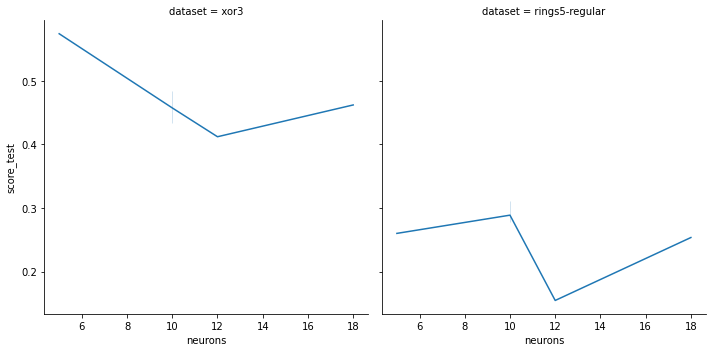

In [1057]:
sns.relplot(x="neurons",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="ACC"])

### Entropy

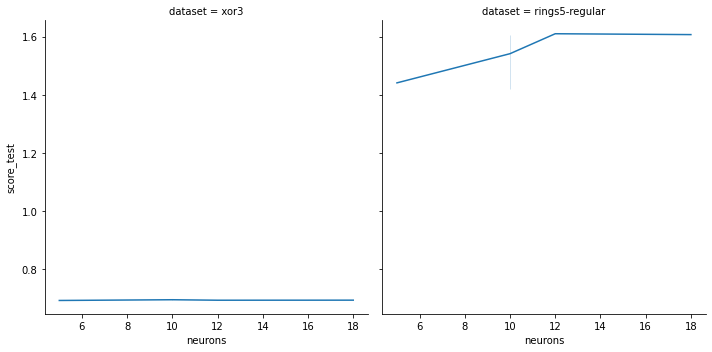

In [1058]:
sns.relplot(x="neurons",y="score_test",col="dataset",kind="line",data=df_c[df_c.cost_function=="Entropy"])

Ponownie [3,3,3,3] jest słaba, ale co ciekawe [10] daję lepszę wyniki niż [5,5] oraz [3,4,3]. Możliwe że szerokość sieci jest ważna.

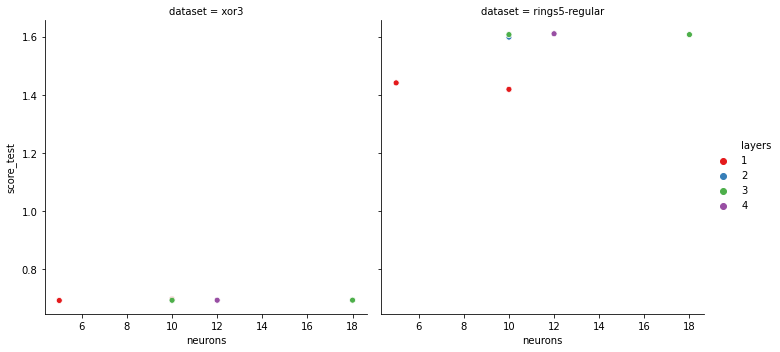

In [1059]:
sns.relplot(x="neurons",y="score_test",col="dataset",kind="scatter",hue="layers",data=df_c[df_c.cost_function=="Entropy"],palette=sns.color_palette("Set1", df_r.layers.nunique()))

## Wykres czasu od liczby neuronów i warstw

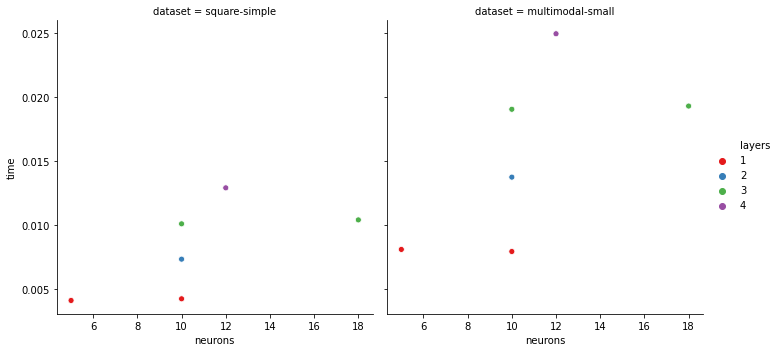

In [1060]:
sns.relplot(x="neurons",y="time",col="dataset",hue="layers",kind="scatter",data=df[df.problem!="classification"],palette=sns.color_palette("Set1", df_r.layers.nunique()))

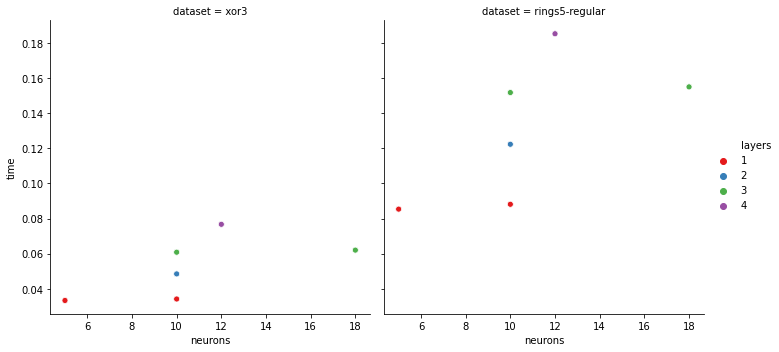

In [1061]:
sns.relplot(x="neurons",y="time",col="dataset",hue="layers",kind="scatter",data=df[df.problem=="classification"],palette=sns.color_palette("Set1", df_r.layers.nunique()))

## Wykres czasu od liczby wag i warstw

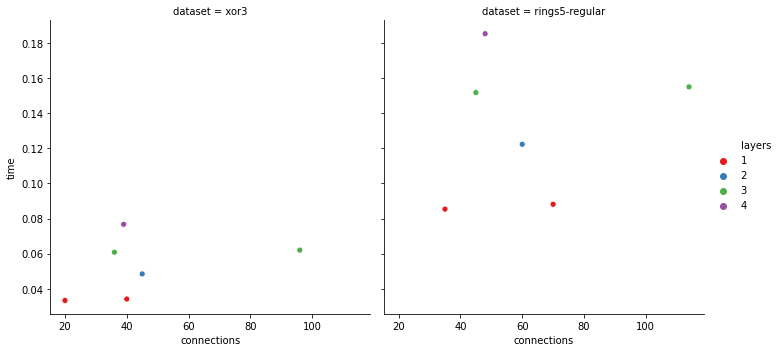

In [1062]:
sns.relplot(x="connections",y="time",col="dataset",kind="scatter",hue="layers",data=df[df.problem=="classification"],palette=sns.color_palette("Set1", df_r.layers.nunique()))

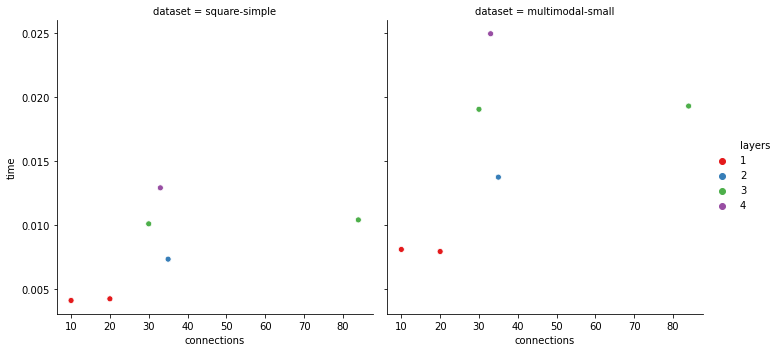

In [1063]:
sns.relplot(x="connections",y="time",col="dataset",kind="scatter",hue="layers",data=df[df.problem!="classification"],palette=sns.color_palette("Set1", df_r.layers.nunique()))

## Wykres czasu od liczby warstw

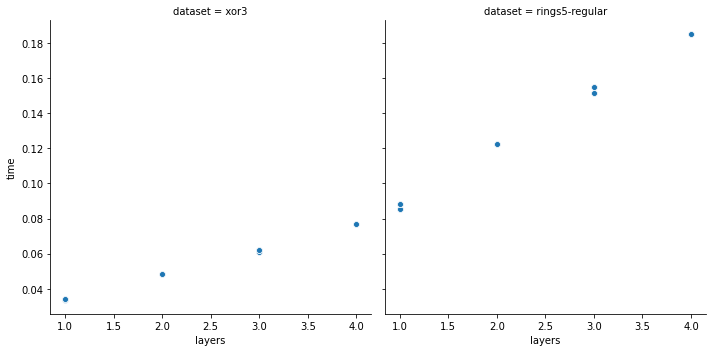

In [1064]:
sns.relplot(x="layers",y="time",col="dataset",kind="scatter",data=df[df.problem=="classification"])

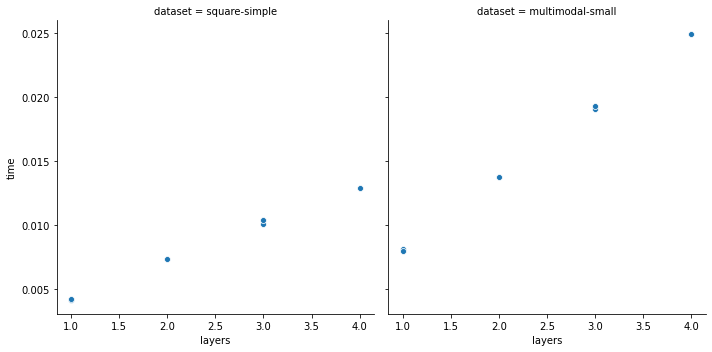

In [1065]:
sns.relplot(x="layers",y="time",col="dataset",kind="scatter",data=df[df.problem!="classification"])

Wniosek jest taki że im więcej warstw tym dłuższy średni czas na epoke, liczba neuronów w warstwie nie jest tak kluczowa.

## Wykres błędów square-simple

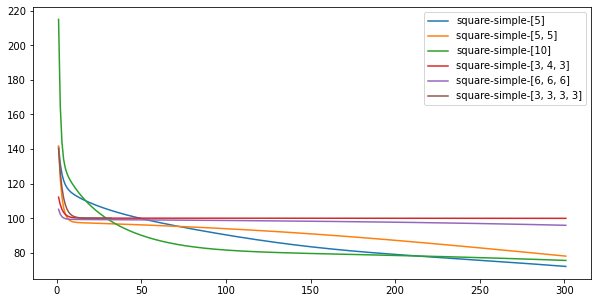

In [1066]:
plt.figure(figsize=(10,5))
for x in range(0,6):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Widzimy dominację szerokich sieci nad wąskimi

## Wykres błędów multimodal-small

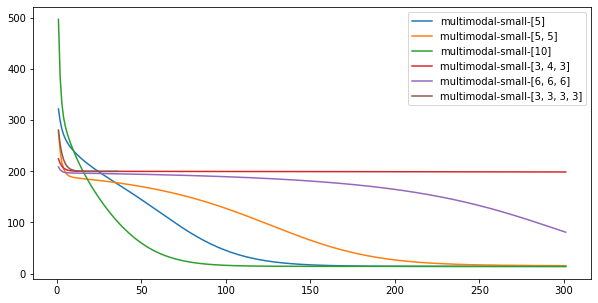

In [1067]:
plt.figure(figsize=(10,5))
for x in range(6,12):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Tutaj można nie dojrzeć, ale [3,3,3,3] zakończyła uczenie przedwcześnie, zaś [10] jest najlepsza, im więcej warstw tym gorzej!

## Wykres błędów xor3

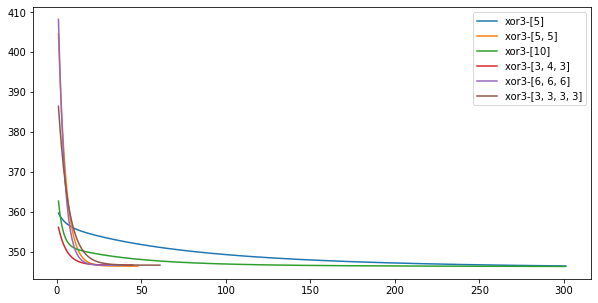

In [1068]:
plt.figure(figsize=(10,5))
for x in range(12,18):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Tutaj jest mniej oczywiste, ale [10] jest znakomitą, ale nie tak dominującą architekturą tu też widać że jest lepsza od [5] i [5,5]

## Wykres błędów rings5-regular

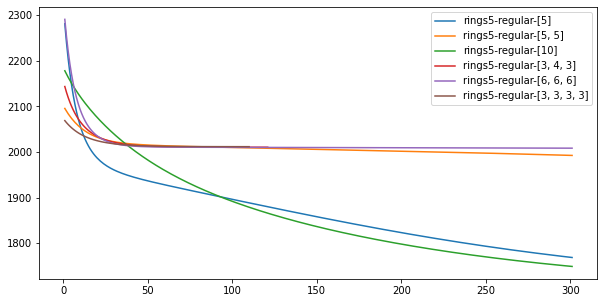

In [1069]:
plt.figure(figsize=(10,5))
for x in range(18,24):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Ponownie [10] jest najlepsze, zaś wąskie architektury wcześniej zakończyły uczenie

# Podsumowanie

Przede wszystkim pokazaliśmy że szerokość warstwy jest bardzo ważna, architektury które są wąskie i długie, są gorsze niż te które są szerokie i krótkie. Ilość warstw okazała się najważniejsza przy czasie trwania procesu uczenia na epokę. Należy pamiętać że architektura [10] miała największą pierwszą i ostatnią warstwę, więc możliwę że to jest ważnę.

# Eksperyment 2 wpływ batchy na uczenie

Spróbujemy przyspieszyć proces uczenia poprzez używanie tzw. batchy czyli podczas wyznaczania gradientu będziemy brali tylko część zbioru danych. Rozpatrzymy branie całego zbioru, 10% i 20%. Przetestujemy na zbiorach square-simple, steps-small i multimodal-small. Zbiory danych uczących są mieszane na samym początku, przed jakimkolwiek uczeniem. Bedzięmy testować na architekturze [8,8]. Będziemy używać zbiorów square-simple, steps-small, multimodal-small.

# Hipoteza: branie części zbioru danych znacznie przyspieszy uczenie, ale może pogorszyć wyniki

## square-simple

In [1070]:
test = np.loadtxt("mio1/regression/square-simple-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1071]:
test = np.loadtxt("mio1/regression/square-simple-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

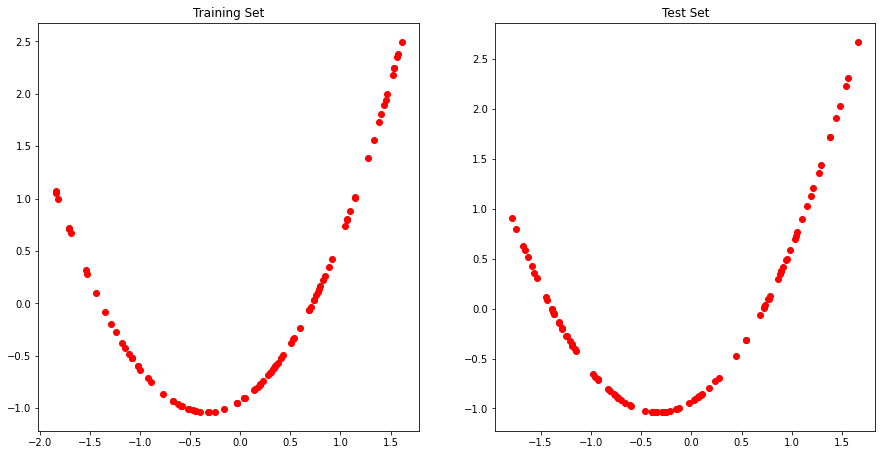

In [1072]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1073]:
L=[8,8]
for B in [1,0.2,0.1]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("square-simple-"+str(B))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"square-simple","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":B},ignore_index=True)

start error 113.3304994950165
end in epoch 300 with error 73.2306771186177
start error 113.3304994950165
end in epoch 300 with error 5.123635781219552
start error 113.3304994950165
end in epoch 300 with error 1.4907447906426188


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.012')]

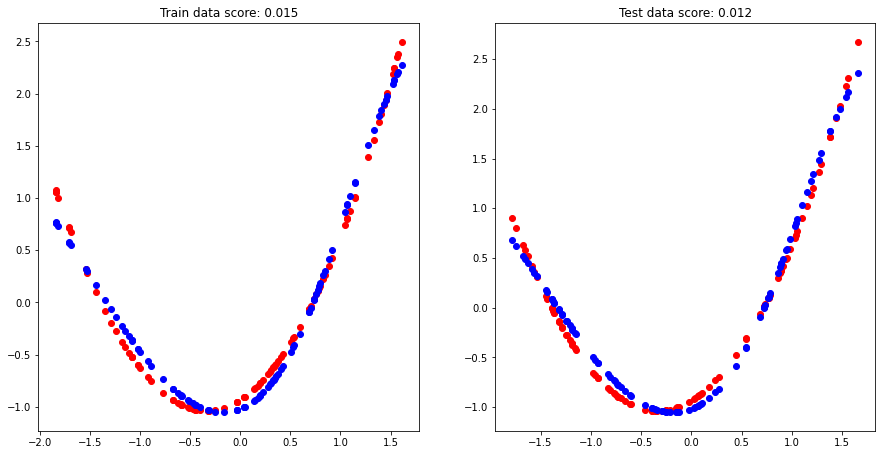

In [1074]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## steps-small

In [1075]:
test = np.loadtxt("mio1/regression/steps-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1076]:
test = np.loadtxt("mio1/regression/steps-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

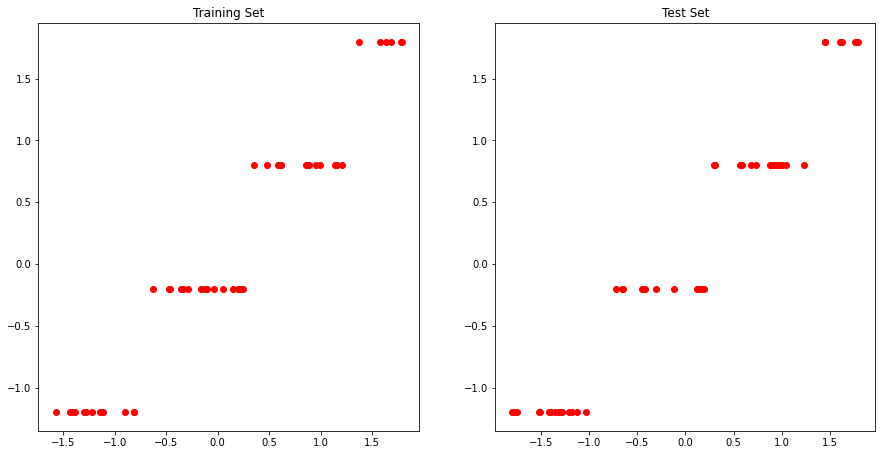

In [1077]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1078]:
L=[8,8]
for B in [1,0.2,0.1]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("steps-small-"+str(B))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"steps-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":B},ignore_index=True)

start error 53.8183275756853
end in epoch 300 with error 3.431027905819267
start error 53.8183275756853
end in epoch 300 with error 3.056114908275434
start error 53.8183275756853
end in epoch 300 with error 3.0952950354161404


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.062')]

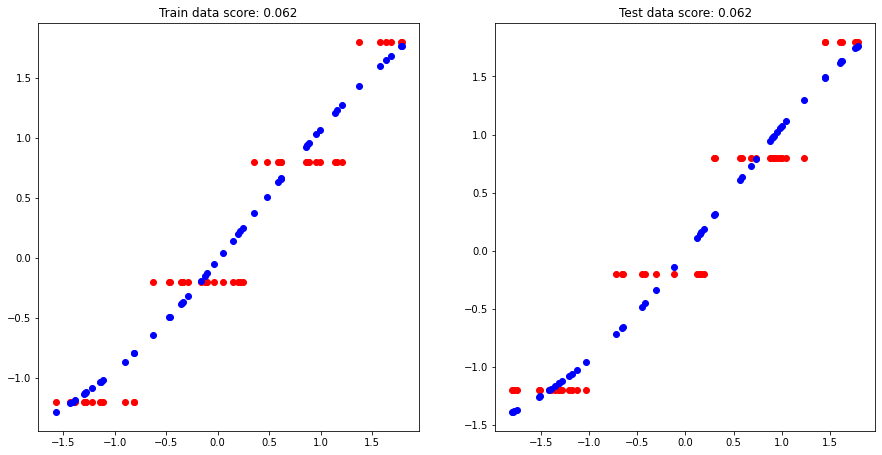

In [1079]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## multimodal-small

In [1080]:
test = np.loadtxt("mio1/regression/multimodal-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1081]:
test = np.loadtxt("mio1/regression/multimodal-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

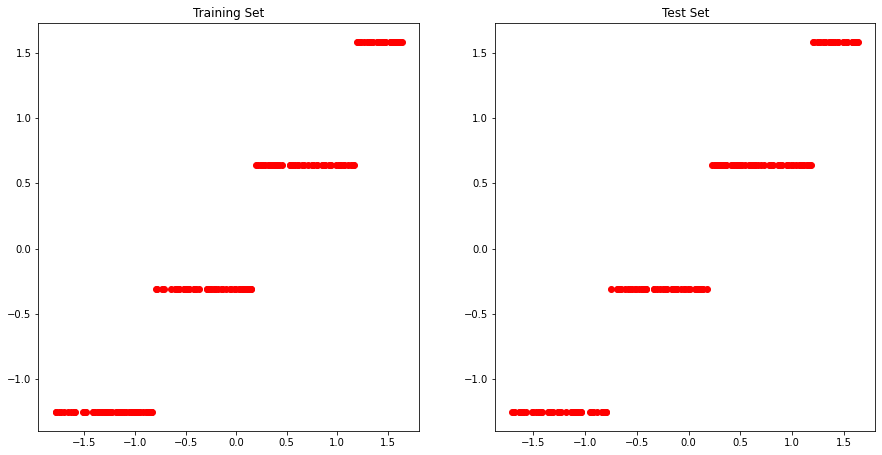

In [1082]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1083]:
L=[8,8]
for B in [1,0.2,0.1]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("multimodal-small-"+str(B))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"multimodal-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0,"RMSprop":False,"batch":B},ignore_index=True)

start error 215.257099838959
end in epoch 300 with error 14.592711562588411
start error 215.257099838959
end in epoch 300 with error 13.733949909914534
start error 215.257099838959
end in epoch 300 with error 13.527456856833531


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.069')]

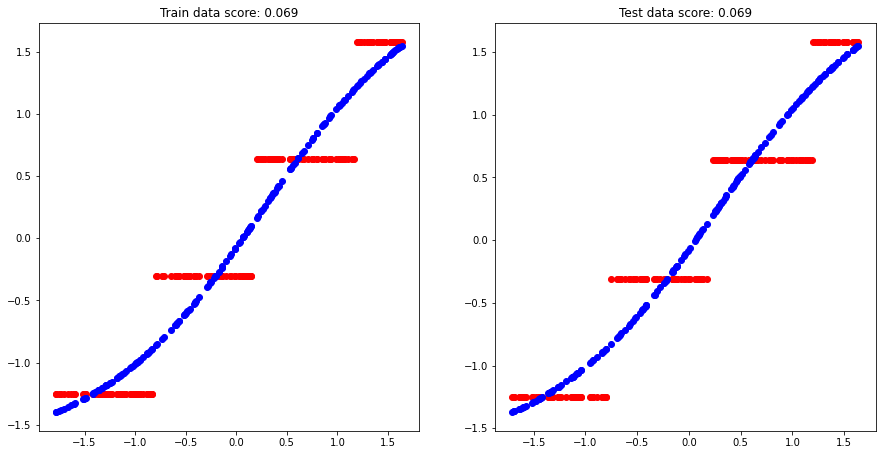

In [1084]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

In [1085]:
df_r=df[df["problem"]!="classification"]

In [1086]:
df_r=df_r[df_r.model_n>=25]

## Wykres wyniku od batch

### MSE

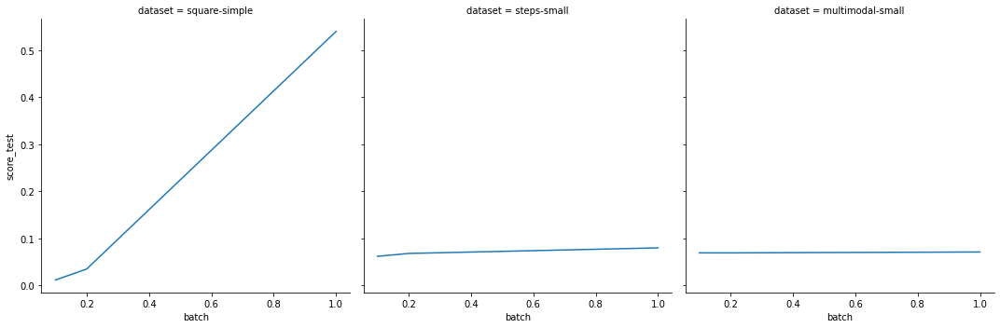

In [1087]:
sns.relplot(x="batch",y="score_test",col="dataset",kind="line",data=df_r)

10% batch daję najlepsze rezultaty.

## Wykres czasu od liczby batch

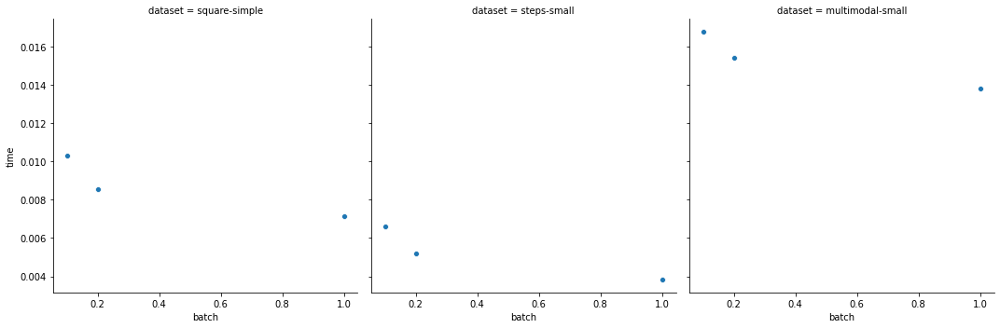

In [1088]:
sns.relplot(x="batch",y="time",col="dataset",kind="scatter",data=df_r)

Batche mają wpływ na tempo uczenia, ale im większy zbiór tym mniejszy

## Wykres błędów square-simple

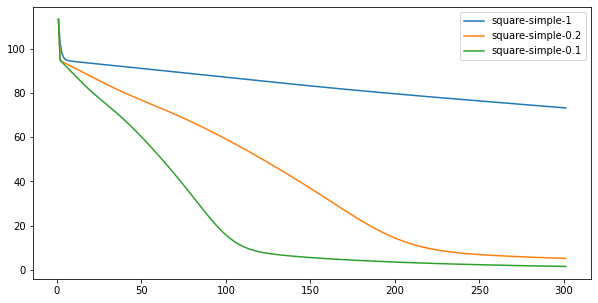

In [1089]:
plt.figure(figsize=(10,5))
for x in range(24,27):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

10% batch najlepszy

## Wykres błędów steps-small

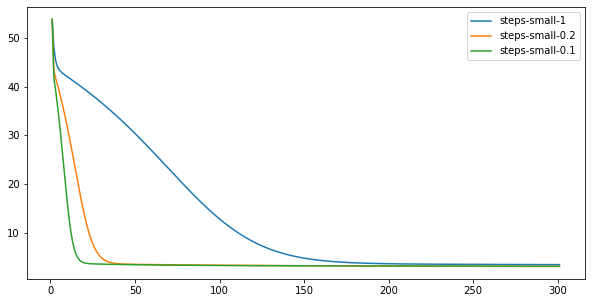

In [1090]:
plt.figure(figsize=(10,5))
for x in range(27,30):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

10% batch najlepszy

## Wykres multimodal-small

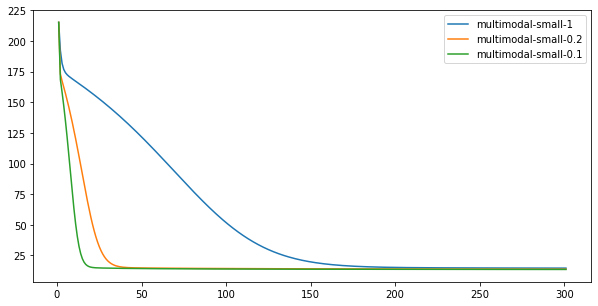

In [1091]:
plt.figure(figsize=(10,5))
for x in range(30,33):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

10% batch najlepszy

# Podsumowanie

Używanie tzw stochastycznego gradientu znacznie przyspiesza proces uczenia.

# Eksperyment 3 wpływ momentu na uczenie

Zbadamy wpływ momentu gradientu na proces uczenia. Zastosujemy metodę spadku gradientu z momentem i bez momentu oraz RMSProp. Za batch weźmiemy 10%. Za betę przyjmiemy 0.9 dla momentu i 0.99 dla RMSProp. To będą jedyne zmiany od podstawowych. Będziemy nadal testować na architekturze [8,8]. Zbiory to: square-small, steps-small, multimodal-small

# Hipoteza: poprawią się wyniki

## square-small

In [1092]:
test = np.loadtxt("mio1/regression/square-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1093]:
test = np.loadtxt("mio1/regression/square-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

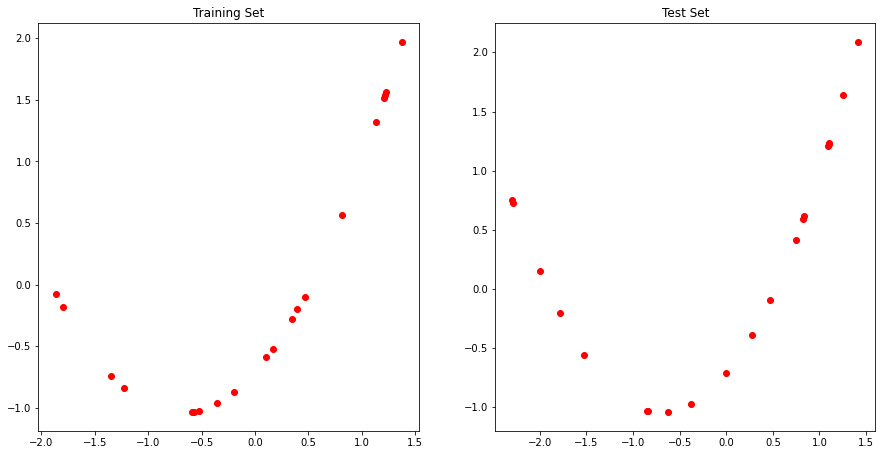

In [1094]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1095]:
L=[8,8]
B=0.1
for M in ["Moment","RMS","None"]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
    start_time = time.time()
    if M=="Moment":
        BETA=0.9
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
        
    if M=="RMS":
        BETA=0.99
        RMSprop=True
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA,RMSprop=RMSprop)
    
    if M=="None":
        BETA=0
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
    
    
    end_time = time.time()
    t=end_time - start_time
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("square-small-"+str(M))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"square-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":BETA,"RMSprop":RMSprop,"batch":B},ignore_index=True)

start error 21.99312636854112
end in epoch 300 with error 0.39192688390603964
start error 21.99312636854112
end in epoch 300 with error 1.8196974105796666
start error 21.99312636854112
end in epoch 300 with error 0.33303320810381826


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.097')]

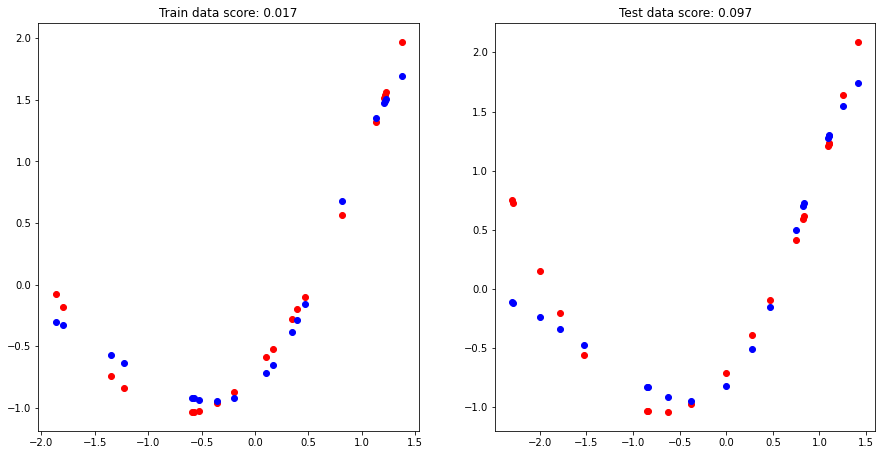

In [1096]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## steps-small

In [1097]:
test = np.loadtxt("mio1/regression/steps-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1098]:
test = np.loadtxt("mio1/regression/steps-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

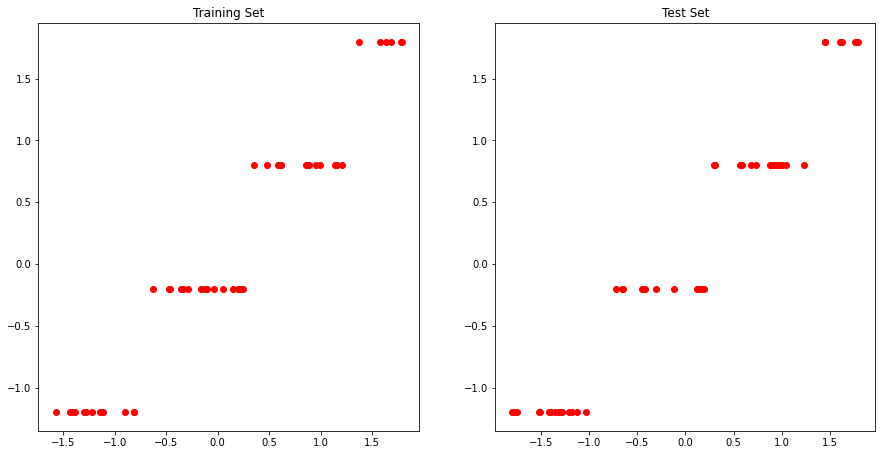

In [1099]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1100]:
L=[8,8]
B=0.1
for M in ["Moment","RMS","None"]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
    start_time = time.time()
    if M=="Moment":
        BETA=0.9
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
        
    if M=="RMS":
        BETA=0.99
        RMSprop=True
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA,RMSprop=RMSprop)
    
    if M=="None":
        BETA=0
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
    
    
    end_time = time.time()
    t=end_time - start_time
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("steps-small-"+str(M))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"steps-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":BETA,"RMSprop":RMSprop,"batch":B},ignore_index=True)

start error 53.8183275756853
end in epoch 300 with error 3.0913275822683537
start error 53.8183275756853
end in epoch 300 with error 1.5398305956387202
start error 53.8183275756853
end in epoch 300 with error 3.0952950354161404


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.026')]

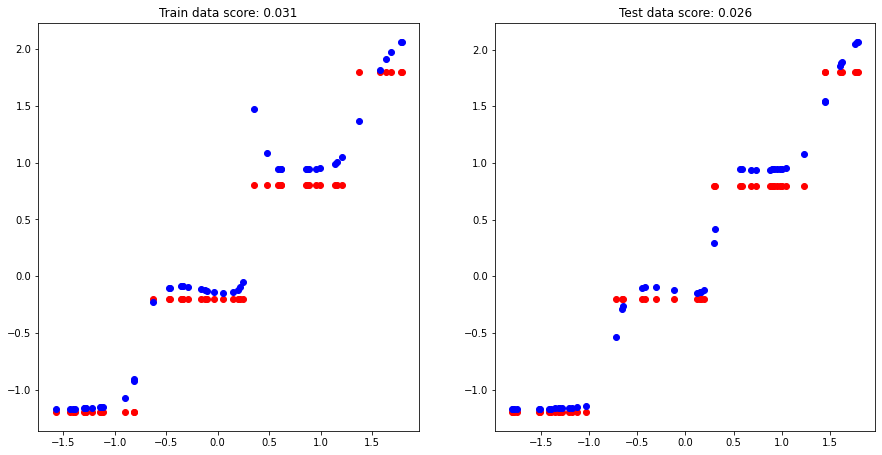

In [1101]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

## multimodal-small

In [1102]:
test = np.loadtxt("mio1/regression/multimodal-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1103]:
test = np.loadtxt("mio1/regression/multimodal-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

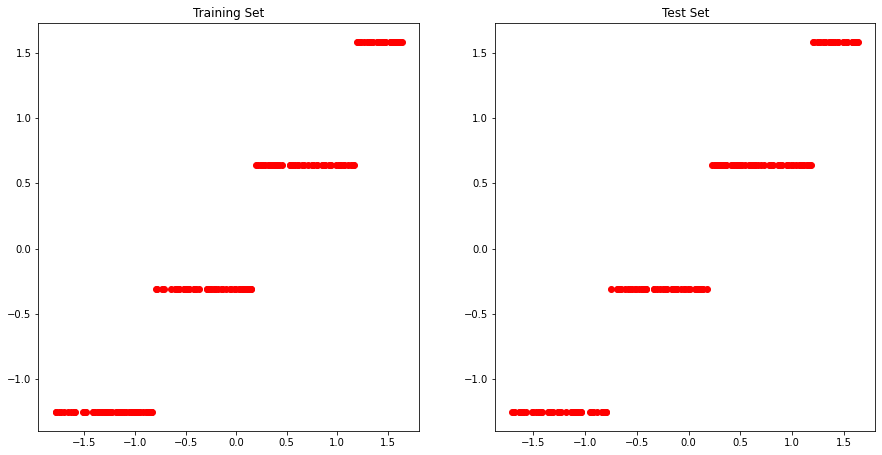

In [1104]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1105]:
L=[8,8]
B=0.1
for M in ["Moment","RMS","None"]:
    mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
    start_time = time.time()
    if M=="Moment":
        BETA=0.9
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
        
    if M=="RMS":
        BETA=0.99
        RMSprop=True
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA,RMSprop=RMSprop)
    
    if M=="None":
        BETA=0
        RMSprop=False
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=B,beta=BETA)
    
    
    end_time = time.time()
    t=end_time - start_time
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("multimodal-small-"+str(M))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.MSE(train_output_layer,output_layer)/output_layer.shape[0]
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.MSE(test_output_layer,output_layer)/output_layer.shape[0]
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    model_n+=1
    t=t/(len(er)-1)
    df=df.append({"model_n":model_n,"problem":"regresion","dataset":"multimodal-small","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":BETA,"RMSprop":RMSprop,"batch":B},ignore_index=True)

start error 215.257099838959
end in epoch 300 with error 13.581736037336125
start error 215.257099838959
end in epoch 300 with error 5.358899007699335
start error 215.257099838959
end in epoch 300 with error 13.527456856833531


## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.039')]

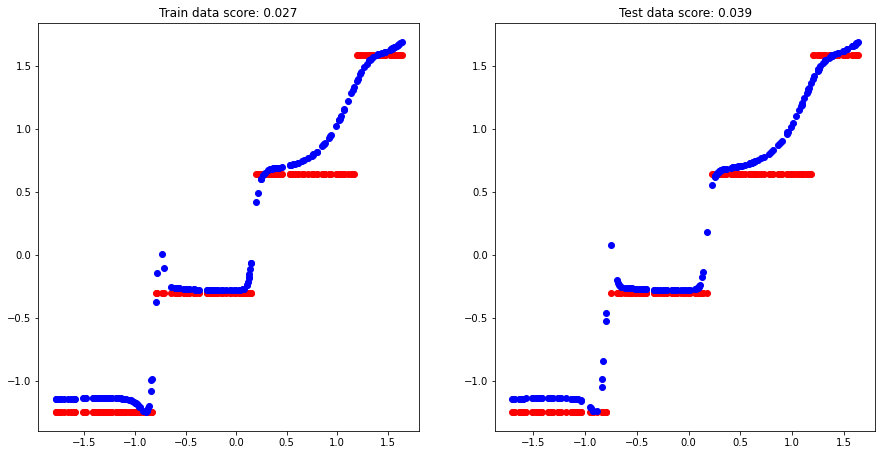

In [1106]:
best=df[df["cost_function"]=="MSE"][-3:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

In [1107]:
df_r=df[df["problem"]!="classification"]

In [1108]:
df_r=df_r[df_r.model_n>=34]

## Wykres wyniku od momentu

### MSE

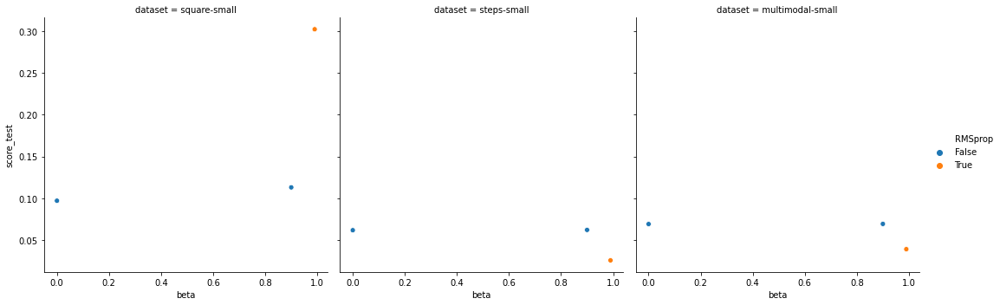

In [1110]:
sns.relplot(x="beta",y="score_test",col="dataset",kind="scatter",data=df_r,hue="RMSprop")

RMSprop daję albo relewacyjne wyniki, albo bardzo słabe, między gradientem z momentem i bez momentu nie widać takiej różnicy.

## Wykres czasu od momentu

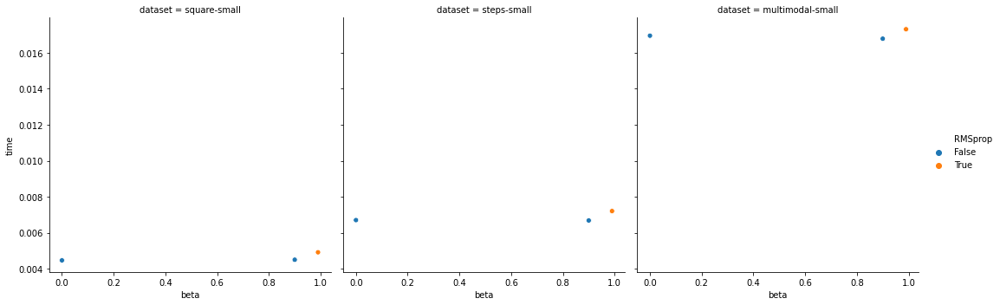

In [1111]:
sns.relplot(x="beta",y="time",col="dataset",kind="scatter",data=df_r,hue="RMSprop")

RMSprop wymaga więcej czasu, ale proporcjonalnie mniej dla większych danych.

## Wykres błędów square-small

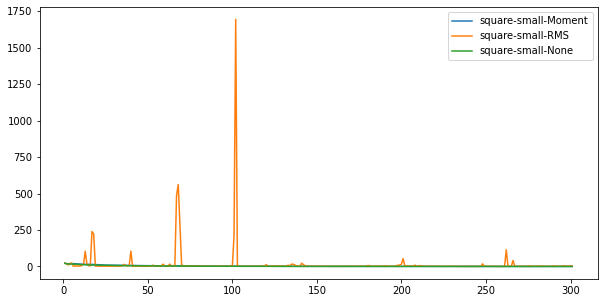

In [1216]:
plt.figure(figsize=(10,5))
for x in range(33,36):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

RMSprop jest niestabilny, moment uczy się wolniej niż brak.

## Wykres błędów steps-small

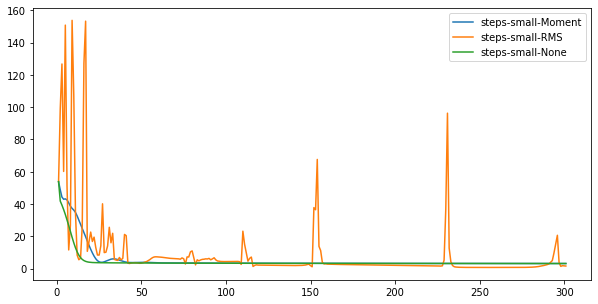

In [1113]:
plt.figure(figsize=(10,5))
for x in range(36,39):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

RMSprop jest niestabilny, moment uczy się wolniej niż brak.

## Wykres multimodal-small

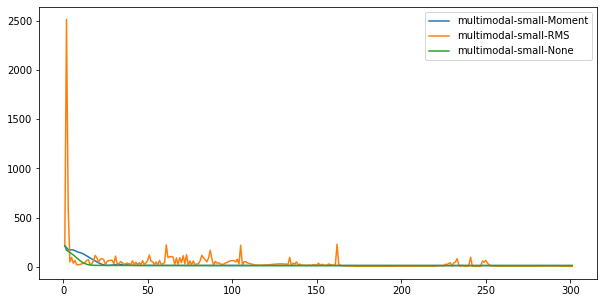

In [1114]:
plt.figure(figsize=(10,5))
for x in range(39,42):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

RMSprop jest niestabilny, moment uczy się wolniej niż brak.

# Podsumowanie

RMSprop może dawać dobre rezultaty, ale ma chaotyczne zachowanie.

# Ekperyment 4 wpływ softmax w procesie uczenia. 

Sprawdzimy czy przy rozwiązywaniu zadań klasyfikacji używanie funkcji softmax na ostatniej warstwie i kross entropii jest lepsze niż MSE. Będziemy testować na zbiorach: rings3-regular, easy i xor3.
Testy przeprowadzimy na architekturze [8,8] używając 10% batch i momentu 0.9.

# Hipoteza: softmax okaże się lepszy.

## rings5-regular

In [1115]:
test = np.loadtxt("mio1/classification/rings3-regular-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1116]:
test = np.loadtxt("mio1/classification/rings3-regular-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

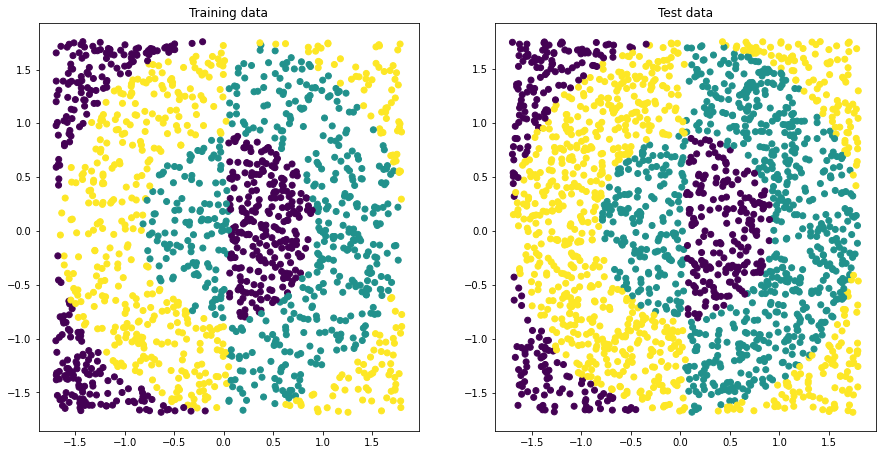

In [1117]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1118]:
L=[8,8]
for SM in ["Entropy","MSE"] :
    if SM=="Entropy":
        mlp_test=ML.MLP_new(2,3,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
    if SM=="MSE":
        mlp_test=ML.MLP_new(2,3,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("rings3-regular-"+SM)
    
    output_layer=mlp_test.calculate(train_input_layer)
    ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    output_layer=mlp_test.calculate(test_input_layer)
    ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    
    if SM=="Entropy":
        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)
    else:
        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.MSE(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.MSE(test_output_layer,output_layer)
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    score_train=score_train/rows_train
    score_test=score_test/rows_test
    t=t/(len(er)-1)
    model_n+=1
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-regular","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
    
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-regular","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":SM,
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 2182.1035202241483
end in epoch 300 with error 1453.005168145319
start error 5509.955196891013
end in epoch 300 with error 896.0480528107394


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

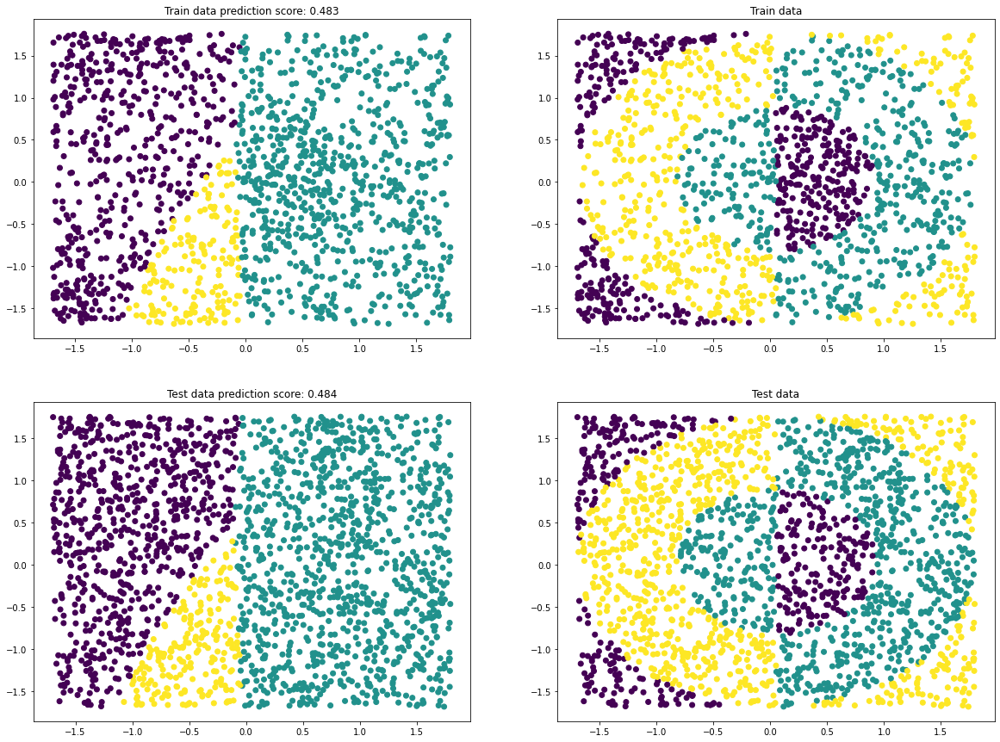

In [1119]:
best=df[df["cost_function"]=="ACC"][-2:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

## easy

In [1120]:
test = np.loadtxt("mio1/classification/easy-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1121]:
test = np.loadtxt("mio1/classification/easy-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

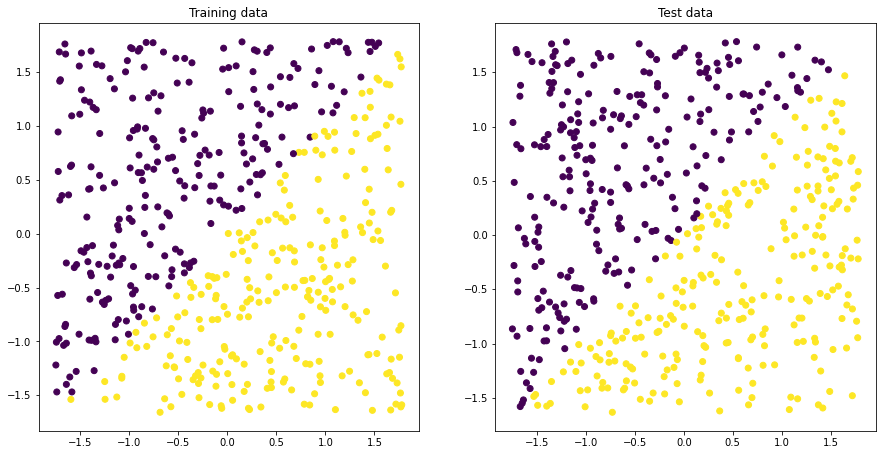

In [1122]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1123]:
L=[8,8]
for SM in ["Entropy","MSE"] :
    if SM=="Entropy":
        mlp_test=ML.MLP_new(2,2,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
    if SM=="MSE":
        mlp_test=ML.MLP_new(2,2,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("easy-"+SM)
    
    output_layer=mlp_test.calculate(train_input_layer)
    ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    output_layer=mlp_test.calculate(test_input_layer)
    ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    
    if SM=="Entropy":
        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)
    else:
        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.MSE(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.MSE(test_output_layer,output_layer)
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    score_train=score_train/rows_train
    score_test=score_test/rows_test
    t=t/(len(er)-1)
    model_n+=1
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"easy","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
    
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"easy","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":SM,
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 376.69492868811903
end in epoch 300 with error 14.61681100151261
start error 382.9076911795768
end in epoch 300 with error 37.615363976990096


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

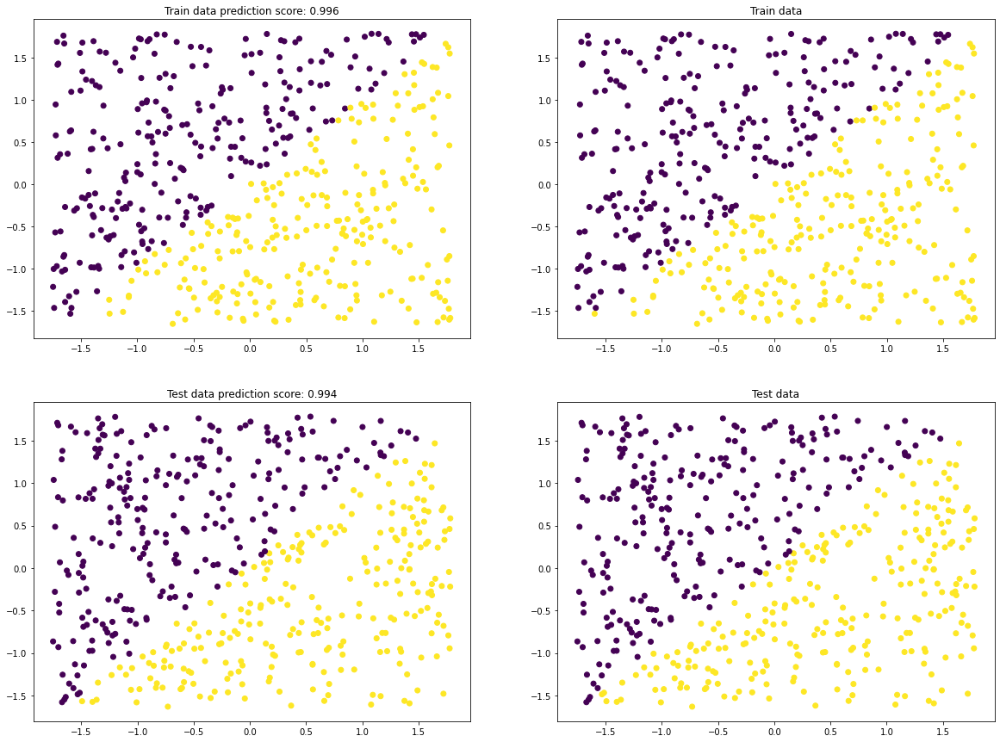

In [1124]:
best=df[df["cost_function"]=="ACC"][-2:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

## xor3

In [1125]:
test = np.loadtxt("mio1/classification/xor3-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1126]:
test = np.loadtxt("mio1/classification/xor3-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

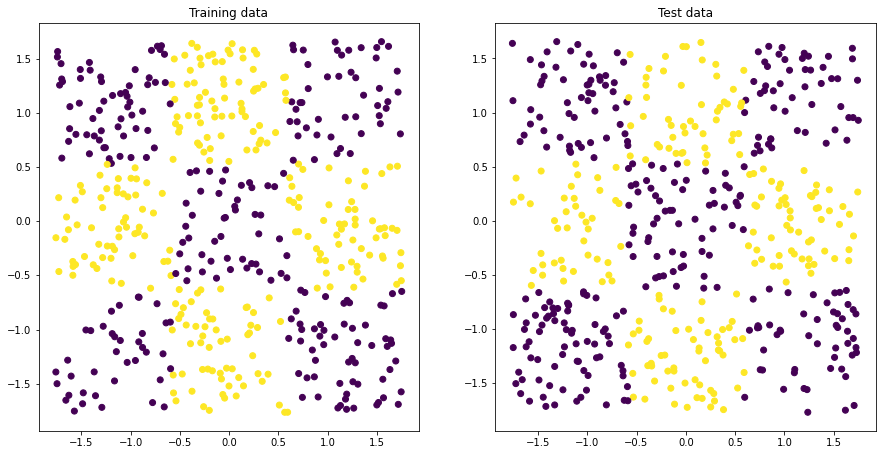

In [1127]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1128]:
L=[8,8]
for SM in ["Entropy","MSE"] :
    if SM=="Entropy":
        mlp_test=ML.MLP_new(2,2,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
    if SM=="MSE":
        mlp_test=ML.MLP_new(2,2,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
    start_time = time.time()
    er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
    end_time = time.time()
    t=end_time - start_time
        
    networks.append(deepcopy(mlp_test))
    networks_err.append(er.copy())
    networks_names.append("xor3-"+SM)
    
    output_layer=mlp_test.calculate(train_input_layer)
    ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    output_layer=mlp_test.calculate(test_input_layer)
    ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))
    
    output_layer=mlp_test.calculate(train_input_layer)
    score_train=ML.cross_entropy(train_output_layer,output_layer)
    output_layer=mlp_test.calculate(test_input_layer)
    score_test=ML.cross_entropy(test_output_layer,output_layer)
    
    L1=sum([np.sum(w**2) for w in mlp_test.weights])
    L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])
    
    rows_train=train_input_layer.shape[0]
    rows_test=test_input_layer.shape[0]
    columns_input=train_input_layer.shape[1]
    columns_output=train_output_layer.shape[1]
    connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
    neurons=sum(L)
    L1=L1/connections
    L2=L2/connections
    score_train=score_train/rows_train
    score_test=score_test/rows_test
    t=t/(len(er)-1)
    model_n+=1
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
    
    df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3","columns_input":columns_input,"columns_output":columns_output,
                  "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                  "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":"sigmoid",
                         "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":SM,
                         "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 373.8620501249626
end in epoch 300 with error 345.8286563810134
start error 377.19417274953923
end in epoch 57 with error 250.41435001031067


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

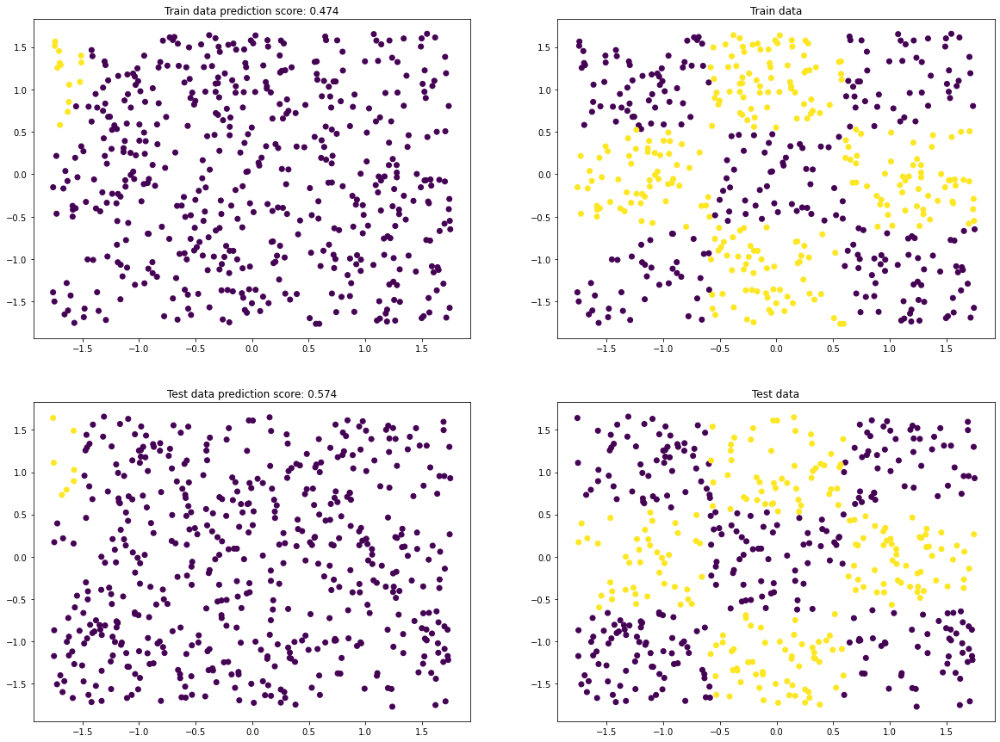

In [1129]:
best=df[df["cost_function"]=="ACC"][-2:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

In [1130]:
df_c=df[df["problem"]=="classification"]

In [1131]:
df_c=df_c[-12:]

## Wykres wyniku od rodzaju funkcji (softmax na pomarańczowo)

## Accuracy

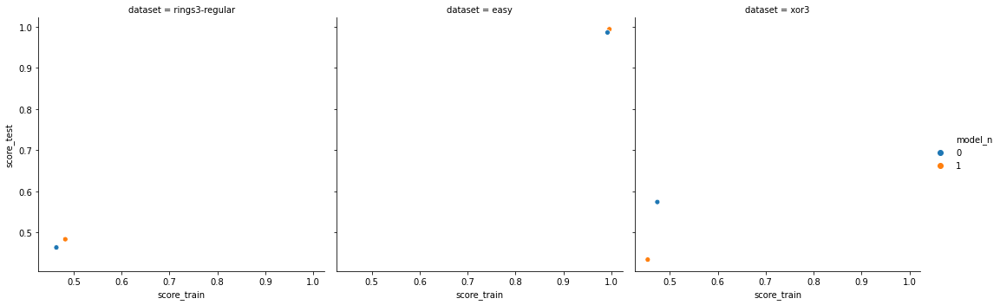

In [1132]:
sns.relplot(x="score_train",y="score_test",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="ACC"],hue=df_c[df_c.cost_function=="ACC"].model_n%2)

softmax daje ogólnie lepsze wyniki, ale z xor miał problemy.

## Wykres czasu

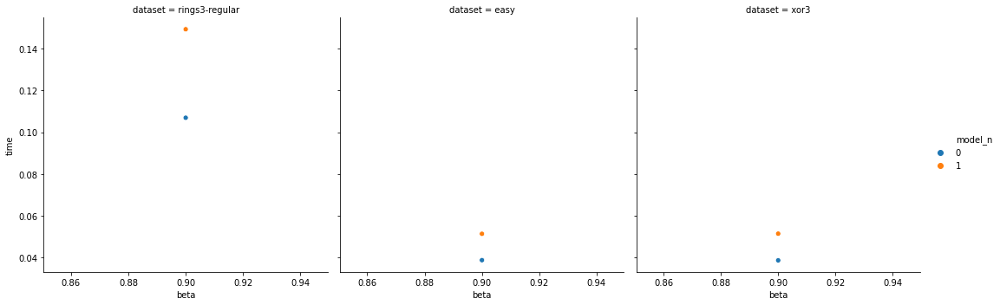

In [1133]:
sns.relplot(x="beta",y="time",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="ACC"],hue=df_c[df_c.cost_function=="ACC"].model_n%2)

softmax wymaga więcej czasu, ale wraz ze wzrostem zbioru danych proporcjonalnie mniej.

## Wykres błędów ring3-regular

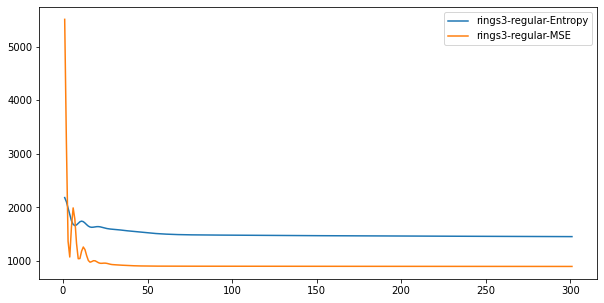

In [1134]:
plt.figure(figsize=(10,5))
for x in range(42,44):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Entropia ma bardziej gładki kształt.

## Wykres błędów easy

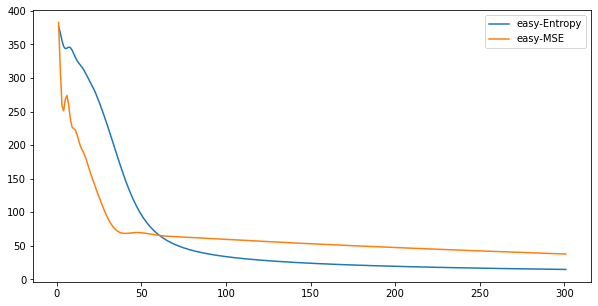

In [1135]:
plt.figure(figsize=(10,5))
for x in range(44,46):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Entropia ma bardziej gładki kształt.

## Wykres xor3

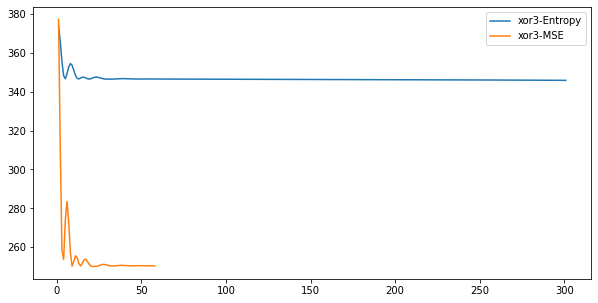

In [1136]:
plt.figure(figsize=(10,5))
for x in range(46,48):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

MSE wcześniej zakończyło naukę

# Podsumowanie

W zadaniach klasyfikacji softmax jest lepszy.

# Eksperyment 5 Różne funkcje aktywacji

Będziemy testować różne funkcje aktywacji: sigmoid, tanh, ReLU i liniową w zależności od liczby warstw i neuronów. Będziemy testować na architekturach [5],[8],[5,5],[8,8],[5,5,5],[8,8,8]. Batch 10%, zaś beta=0.9.

# Hipoteza: sigmoid nie będzie najlepszy

# rings5-regular

In [1137]:
test = np.loadtxt("mio1/classification/rings5-regular-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1138]:
test = np.loadtxt("mio1/classification/rings5-regular-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

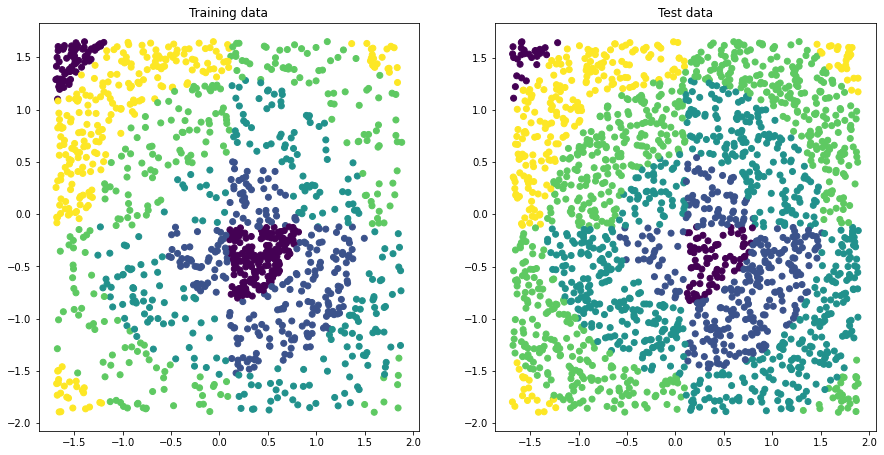

In [1139]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1140]:
for L in [[5],[8],[5,5],[8,8],[5,5,5],[8,8,8]]:
    
    for f in ["sigmoid","ReLU","identity","tanh"]:
        start_time = time.time() 
        if f=="sigmoid":
             mlp_test=ML.MLP_new(2,5,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="ReLU":
             mlp_test=ML.MLP_new(2,5,L,[ML.ReLU]*len(L)+[ML.softmax],[ML.ReLU_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="identity":
             mlp_test=ML.MLP_new(2,5,L,[ML.identity]*len(L)+[ML.softmax],[ML.identity_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="tanh":
             mlp_test=ML.MLP_new(2,5,L,[ML.tanh]*len(L)+[ML.softmax],[ML.tanh_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("rings5-regular-test-"+str(L)+"-"+str(f))

        output_layer=mlp_test.calculate(train_input_layer)
        ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
        output_layer=mlp_test.calculate(test_input_layer)
        ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-regular","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-regular","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)


start error 2281.41630371979
end in epoch 300 with error 1566.0918850332312
start error 1994.8236918331631
end in epoch 300 with error 715.8726550495651
start error 1949.8380200211946
end in epoch 66 with error 1710.708443711198
start error 1915.4083152773112
end in epoch 300 with error 979.7107395856515
start error 2160.0854763823113
end in epoch 300 with error 1542.1173654410493
start error 2148.755588390096
end in epoch 300 with error 584.6097131651334
start error 2261.1543441684325
end in epoch 73 with error 1710.7723813007615
start error 2167.637122666961
end in epoch 300 with error 818.4851168603943
start error 2095.7327004394756
end in epoch 300 with error 1649.6991305638558
start error 2046.106619820558
end in epoch 300 with error 759.3207187571826
start error 2412.408816012826
end in epoch 71 with error 1710.7688680373337
start error 2234.058924313168
end in epoch 300 with error 606.9513471634405
start error 2292.9843085694174
end in epoch 300 with error 1546.1243427595182
sta

[Text(0.5, 1.0, 'Test data')]

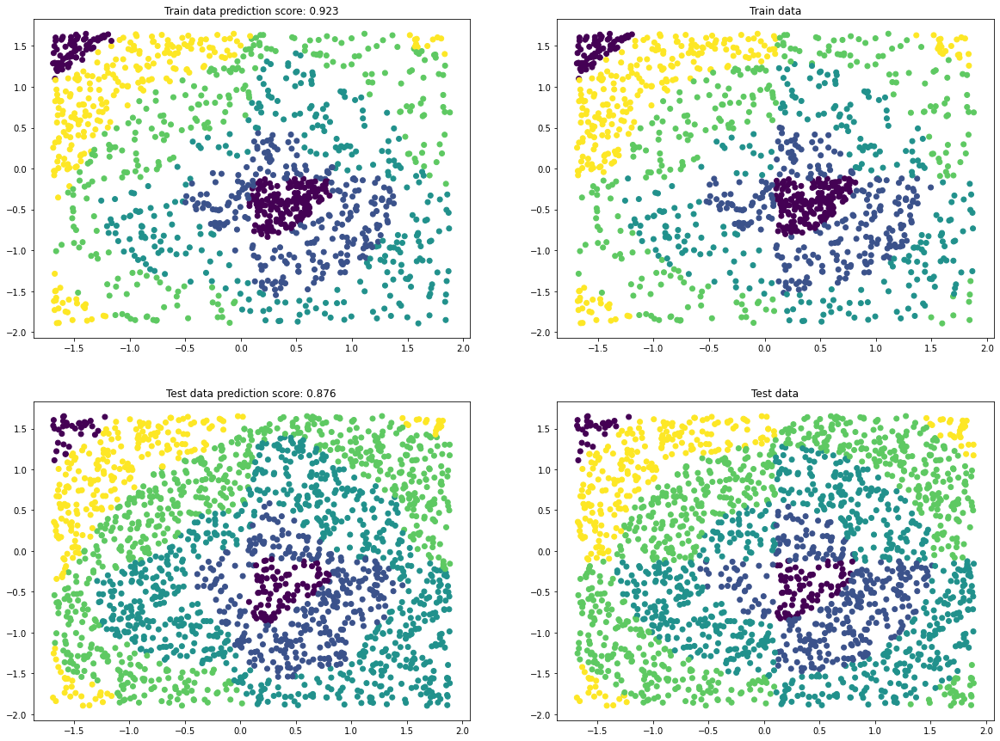

In [1141]:
best=df[df["cost_function"]=="ACC"][-24:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

# rings3-regular

In [1142]:
test = np.loadtxt("mio1/classification/rings3-regular-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1143]:
test = np.loadtxt("mio1/classification/rings3-regular-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

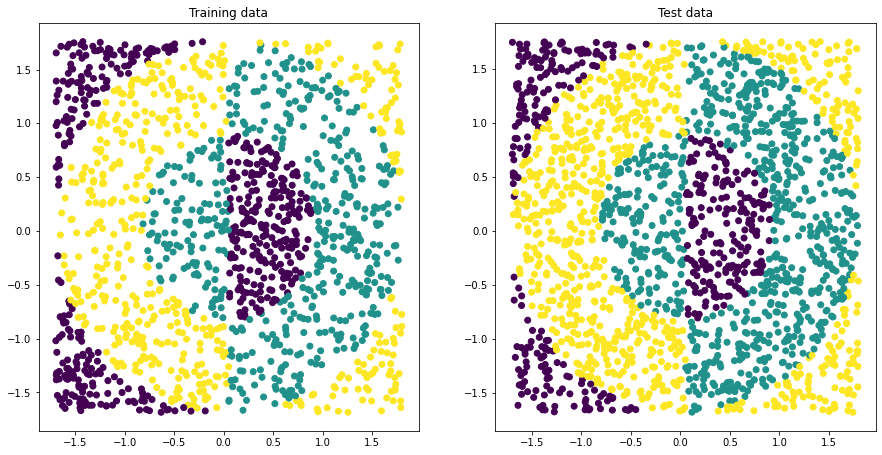

In [1144]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1145]:
for L in [[5],[8],[5,5],[8,8],[5,5,5],[8,8,8]]:
    
    for f in ["sigmoid","ReLU","identity","tanh"]:
        start_time = time.time() 
        if f=="sigmoid":
             mlp_test=ML.MLP_new(2,3,L,[ML.sigmoid]*len(L)+[ML.softmax],[ML.sigmoid_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="ReLU":
             mlp_test=ML.MLP_new(2,3,L,[ML.ReLU]*len(L)+[ML.softmax],[ML.ReLU_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="identity":
             mlp_test=ML.MLP_new(2,3,L,[ML.identity]*len(L)+[ML.softmax],[ML.identity_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        if f=="tanh":
             mlp_test=ML.MLP_new(2,3,L,[ML.tanh]*len(L)+[ML.softmax],[ML.tanh_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("rings3-regular-test-"+str(L)+"-"+str(f))

        output_layer=mlp_test.calculate(train_input_layer)
        ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
        output_layer=mlp_test.calculate(test_input_layer)
        ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-regular","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-regular","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)


start error 1977.745959458745
end in epoch 300 with error 1444.4643288550565
start error 1600.7245416935416
end in epoch 300 with error 1187.5520798411972
start error 1619.3733115653772
end in epoch 55 with error 1482.154297254042
start error 1611.8418292276224
end in epoch 300 with error 1106.2525644366167
start error 1865.3213333194467
end in epoch 41 with error 1482.0263337639303
start error 1713.633998629041
end in epoch 300 with error 515.3164338942873
start error 1777.2715139182533
end in epoch 40 with error 1482.9300960947344
start error 1674.6047056804928
end in epoch 300 with error 659.9871216196996
start error 1795.6508046365382
end in epoch 300 with error 1454.2815776957716
start error 1719.1700871972787
end in epoch 300 with error 1029.0216089901642
start error 2170.0017099380466
end in epoch 65 with error 1482.1783048873303
start error 1917.1434764249143
end in epoch 300 with error 483.91669304795124
start error 2182.1035202241483
end in epoch 300 with error 1452.855805059

## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

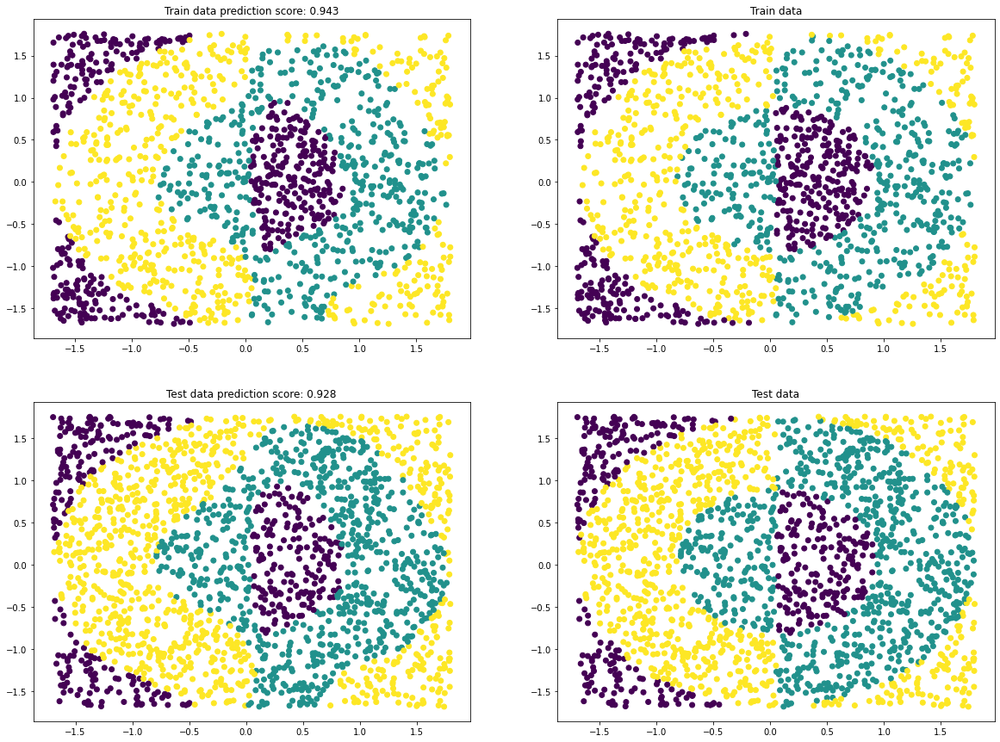

In [1146]:
best=df[df["cost_function"]=="ACC"][-24:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

# steps-small

In [1147]:
test = np.loadtxt("mio1/regression/steps-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1148]:
test = np.loadtxt("mio1/regression/steps-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

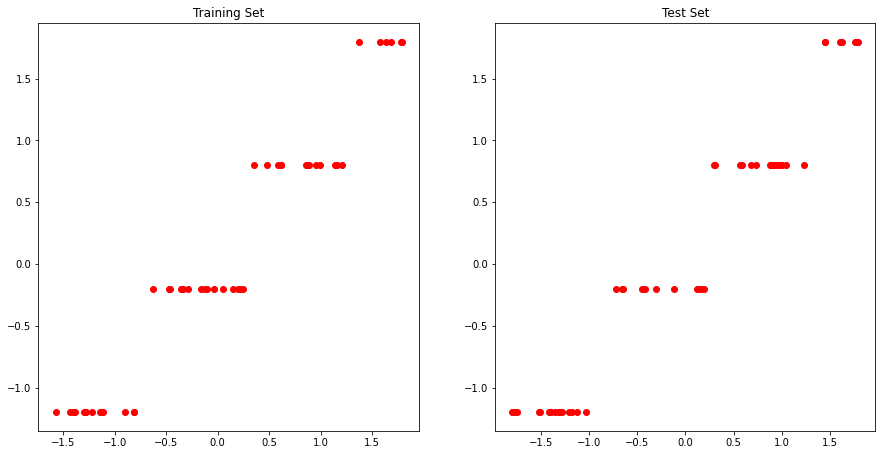

In [1149]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1150]:
for L in [[5],[8],[5,5],[8,8],[5,5,5],[8,8,8]]:
    
    for f in ["sigmoid","ReLU","identity","tanh"]:
        start_time = time.time() 
        if f=="sigmoid":
             mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="ReLU":
             mlp_test=ML.MLP_new(1,1,L,[ML.ReLU]*len(L)+[ML.identity],[ML.ReLU_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="identity":
             mlp_test=ML.MLP_new(1,1,L,[ML.identity]*len(L)+[ML.identity],[ML.identity_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="tanh":
             mlp_test=ML.MLP_new(1,1,L,[ML.tanh]*len(L)+[ML.identity],[ML.tanh_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("steps-small-"+str(L)+"-"+str(f))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.MSE(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.MSE(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"regresion","dataset":"steps-small","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 80.5629575179601
end in epoch 300 with error 3.0140867955956865
start error 95.38016225945972
end in epoch 196 with error 2.714351419226646
start error 154.70225108991482
end in epoch 300 with error 3.1460709178804023
start error 140.33404552661796
end in epoch 300 with error 2.9485701984333494
start error 50.32961920951002
end in epoch 300 with error 3.0264900703376365
start error 38.180877268504034
end in epoch 300 with error 2.5545614552252864
start error 21.75235719684185
end in epoch 300 with error 3.05934852224415
start error 20.528361608091586
end in epoch 300 with error 2.9249990487851028
start error 69.34240253635109
end in epoch 300 with error 3.281985013732298
start error 34.94164365626314
end in epoch 300 with error 2.4541760944588873
start error 13.046688061237733
end in epoch 300 with error 3.1237632597655978
start error 20.703800837276436
end in epoch 300 with error 3.2503199575335877
start error 53.8183275756853
end in epoch 300 with error 3.2402095969551175

## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.029')]

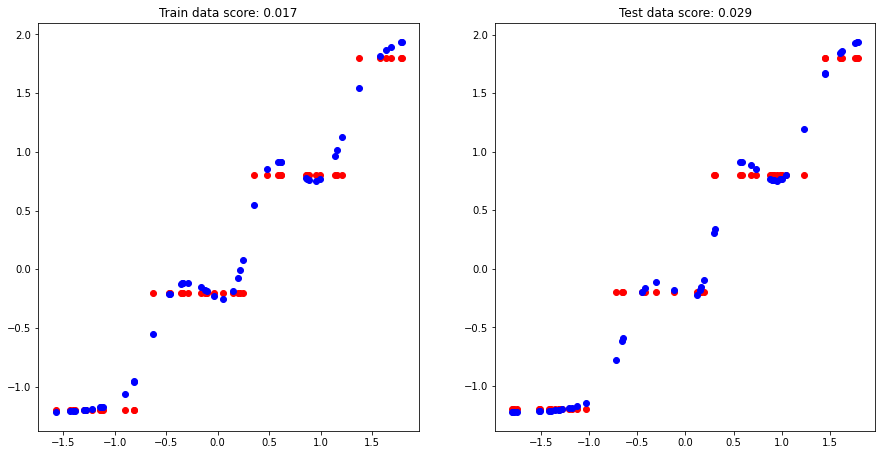

In [1151]:
best=df[df["cost_function"]=="MSE"][-24:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

# multimodal-small

In [1152]:
test = np.loadtxt("mio1/regression/multimodal-small-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1153]:
test = np.loadtxt("mio1/regression/multimodal-small-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

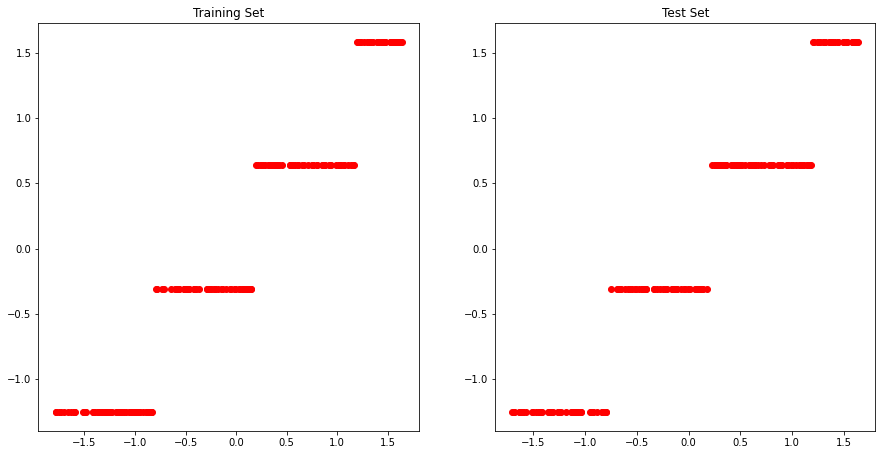

In [1154]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1155]:
for L in [[5],[8],[5,5],[8,8],[5,5,5],[8,8,8]]:
    
    for f in ["sigmoid","ReLU","identity","tanh"]:
        start_time = time.time() 
        if f=="sigmoid":
             mlp_test=ML.MLP_new(1,1,L,[ML.sigmoid]*len(L)+[ML.identity],[ML.sigmoid_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="ReLU":
             mlp_test=ML.MLP_new(1,1,L,[ML.ReLU]*len(L)+[ML.identity],[ML.ReLU_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="identity":
             mlp_test=ML.MLP_new(1,1,L,[ML.identity]*len(L)+[ML.identity],[ML.identity_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        if f=="tanh":
             mlp_test=ML.MLP_new(1,1,L,[ML.tanh]*len(L)+[ML.identity],[ML.tanh_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        
        er=mlp_test.train(train_input_layer,train_output_layer,max_epoch=MAX_EPOCH,Verbose=False,batch=0.1,beta=0.9)
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("multimodal-small-"+str(L)+"-"+str(f))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.MSE(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.MSE(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"regresion","dataset":"multimodal-small","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":"None","alpha":0,"activation_function":f,
                             "validate":0,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 321.7976280230672
end in epoch 300 with error 13.523213975497816
start error 385.5265907403621
end in epoch 115 with error 11.8323418591898
start error 616.7455997943564
end in epoch 96 with error 16.184942030902253
start error 561.2645201531484
end in epoch 300 with error 13.946971682586435
start error 201.6192566990786
end in epoch 300 with error 13.394691243930136
start error 150.5706018432636
end in epoch 300 with error 11.761199608059911
start error 87.96343978896529
end in epoch 300 with error 14.827097458067641
start error 83.08814691181621
end in epoch 300 with error 13.396561465969034
start error 277.4351535695655
end in epoch 300 with error 13.772565999822625
start error 137.42419146259206
end in epoch 300 with error 11.760837401570686
start error 53.57917704240574
end in epoch 61 with error 15.191239491072595
start error 82.49546704801077
end in epoch 300 with error 13.708283701321744
start error 215.257099838959
end in epoch 300 with error 13.567123370634164
sta

## Najlepszy model

[Text(0.5, 1.0, 'Test data score: 0.029')]

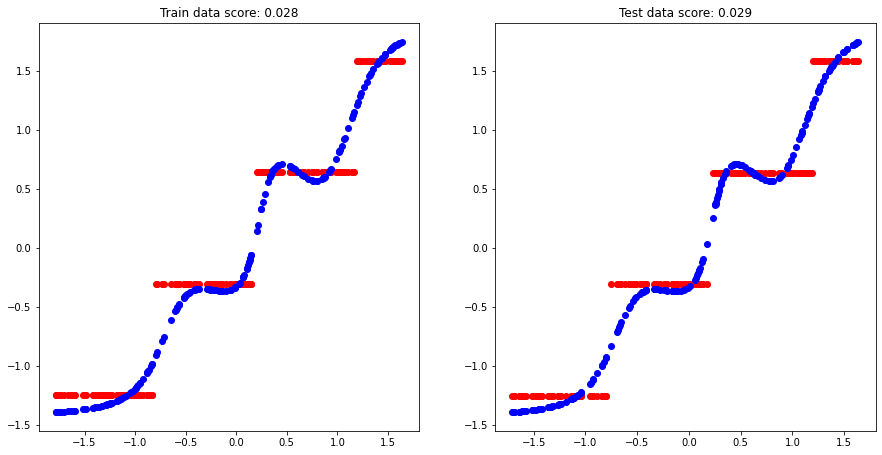

In [1156]:
best=df[df["cost_function"]=="MSE"][-24:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

In [1157]:
df_c=df[df["problem"]=="classification"]

In [1158]:
df_r=df[df["problem"]!="classification"]

In [1159]:
df_r=df_r[-48:]

In [1160]:
df_c=df_c[-96:]

## Wyniki od liczby warstw i funkcji aktywacji

## MSE

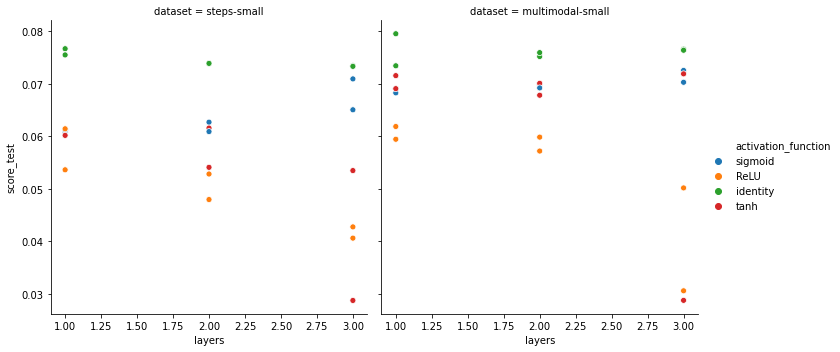

In [1161]:
sns.relplot(x="layers",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_r)

## Accuracy

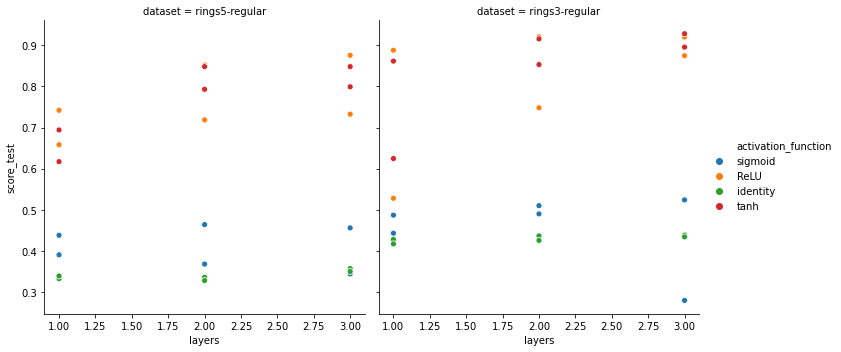

In [1162]:
#dla problemu regresji im niżej tym lepiej "accuracy" to w tym wypadku MSE
sns.relplot(x="layers",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="ACC"])

## Entropy

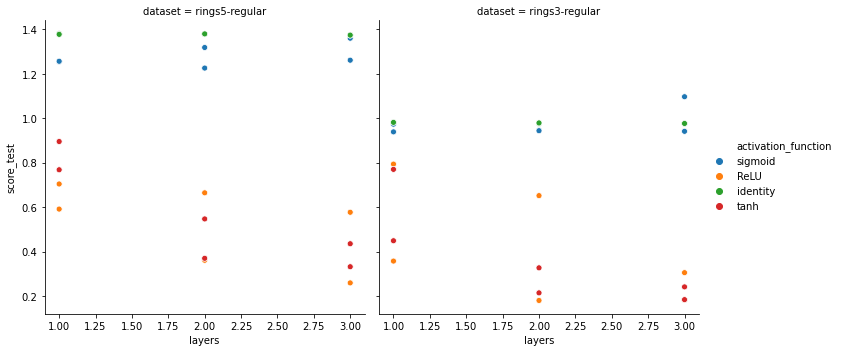

In [1163]:
#dla problemu regresji im niżej tym lepiej "accuracy" to w tym wypadku MSE
sns.relplot(x="layers",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="Entropy"])

## Wyniki od liczby neuronów i funkcji aktywacji

## MSE

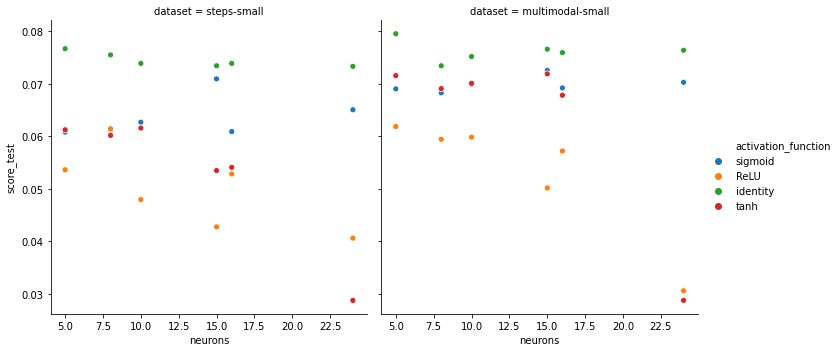

In [1164]:
sns.relplot(x="neurons",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_r)

## Accuracy

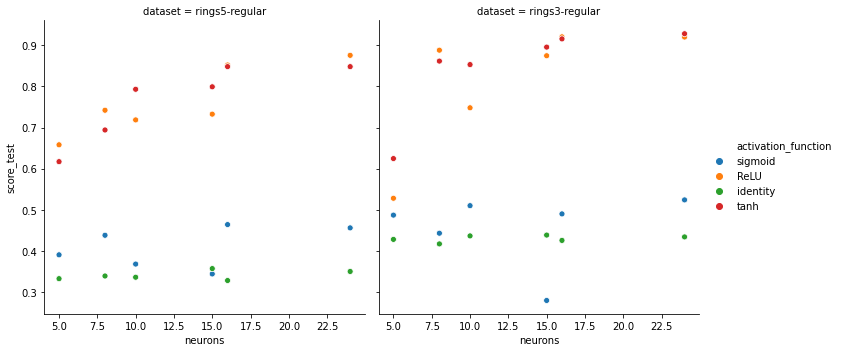

In [1165]:
#dla problemu regresji im niżej tym lepiej "accuracy" to w tym wypadku MSE
sns.relplot(x="neurons",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="ACC"])

## Entropy

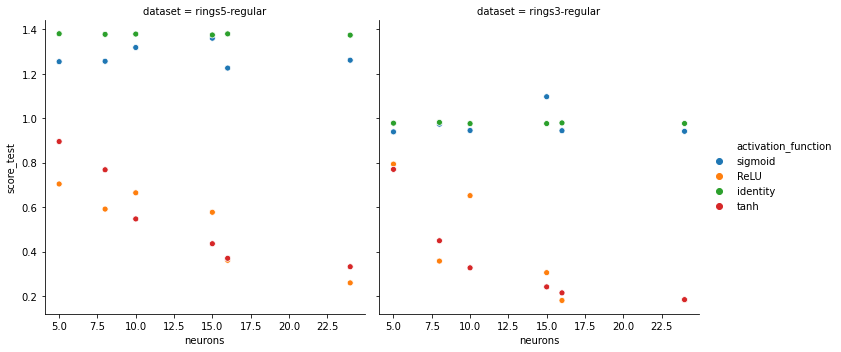

In [1166]:
#dla problemu regresji im niżej tym lepiej "accuracy" to w tym wypadku MSE
sns.relplot(x="neurons",y="score_test",hue="activation_function",col="dataset",kind="scatter",data=df_c[df_c.cost_function=="Entropy"])

Ogólnie to tanh i ReLu dają podobne rezultaty i są lepsze niż liniowa i sigmoid.

## Wykres błędów rings5-regular 1 warstwa

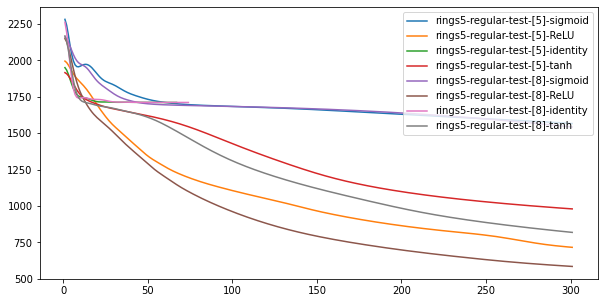

In [1167]:
plt.figure(figsize=(10,5))
for x in range(48,56):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów rings5-regular 2 warstwy

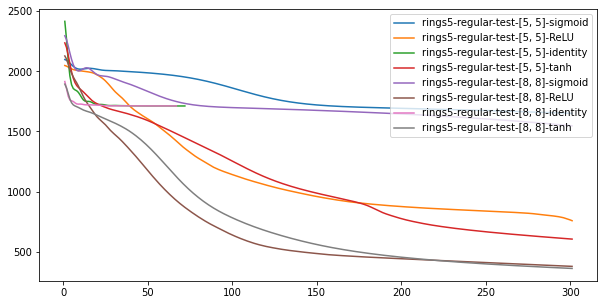

In [1168]:
plt.figure(figsize=(10,5))
for x in range(56,64):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów rings5-regular 3 warstwy

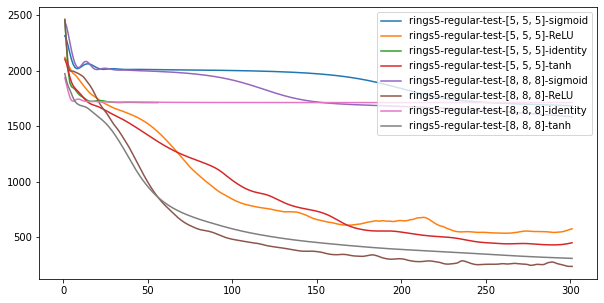

In [1169]:
plt.figure(figsize=(10,5))
for x in range(64,72):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów rings3-regular 1 warstwa

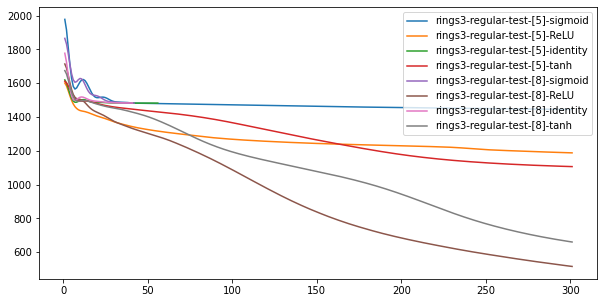

In [1170]:
plt.figure(figsize=(10,5))
for x in range(72,80):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów rings3-regular 2 warstwy

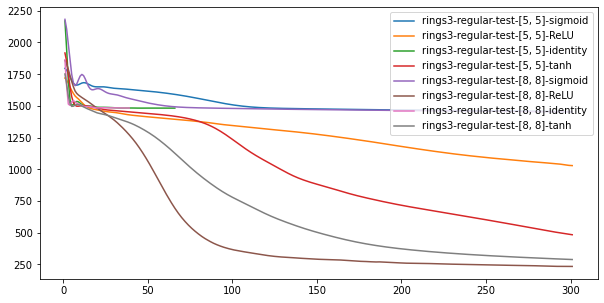

In [1171]:
plt.figure(figsize=(10,5))
for x in range(80,88):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów rings3-regular 3 warstwy

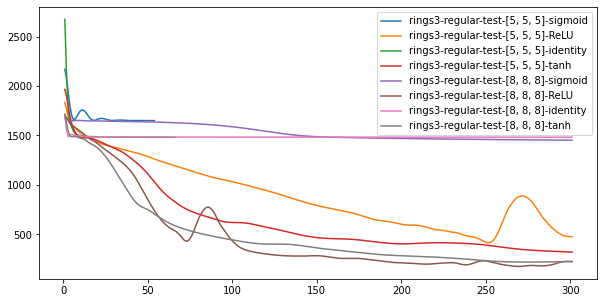

In [1172]:
plt.figure(figsize=(10,5))
for x in range(88,96):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów steps-small 1 warstwa

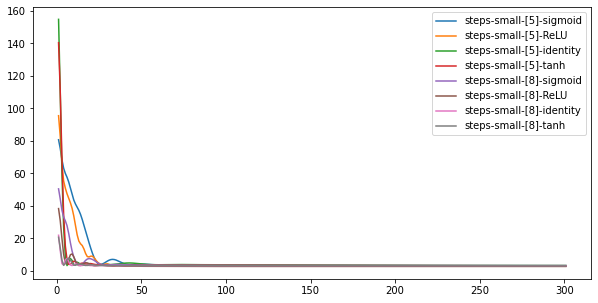

In [1173]:
plt.figure(figsize=(10,5))
for x in range(96,104):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów steps-small 2 warstwy

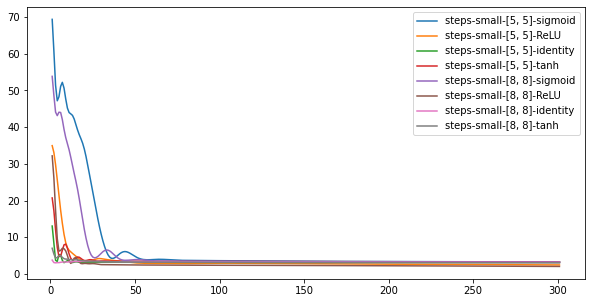

In [1174]:
plt.figure(figsize=(10,5))
for x in range(104,112):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów steps-small 3 warstwy

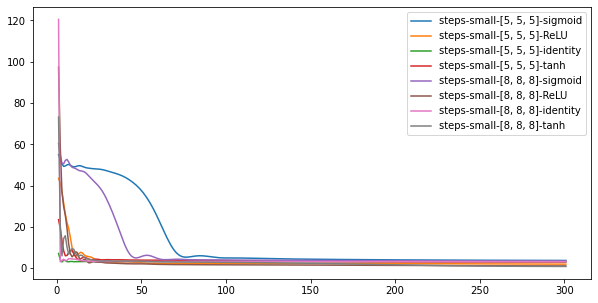

In [1175]:
plt.figure(figsize=(10,5))
for x in range(112,120):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów multimodal-small 1 warstwa

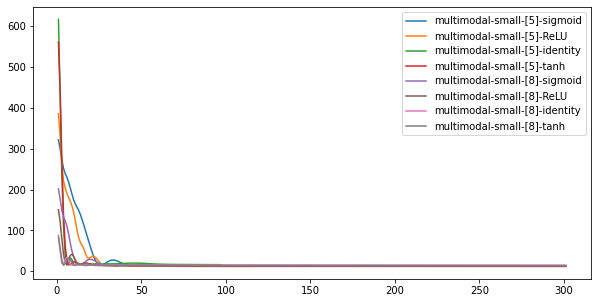

In [1176]:
plt.figure(figsize=(10,5))
for x in range(120,128):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów multimodal-small 2 warstwy

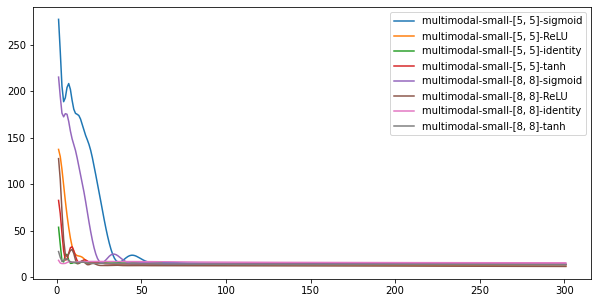

In [1177]:
plt.figure(figsize=(10,5))
for x in range(128,136):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów multimodal-small 3 warstwy

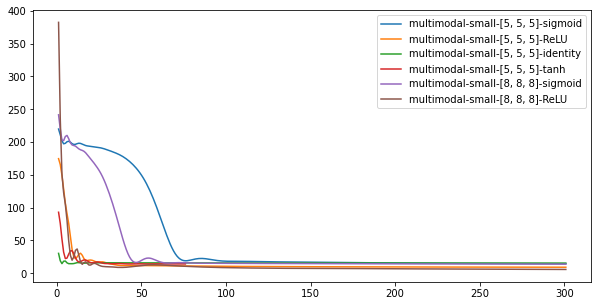

In [1178]:
plt.figure(figsize=(10,5))
for x in range(136,142):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

# Podsumowanie

Widzimy żę ReLU może zachowywać się niestabilnie, to znaczy że może mieć okresowo wzrosty błędu, zaś tanh jest stabilniejszy i daję podobne rezultaty

# Eksperyment 6 regularyzacja i walidacja

Sprawdzimy jak działa mechanizm regularyzacji i walidacji. Za zbiór walidacyjny będziemy brali zbiór testowy. Walidacja będzie działać w ten sposób że jak k razy pod rząd pogorszy się na walidacyjnym to zaprzestajemy dalszej nauki. Regularyzacja jest L1 i L2 z alpha (współczynnikiem regularyzacji) równym 0.01. Funkcją aktywacji będzie tanh, arhitekturą [8,8], beta=0.9 i 10% batch.Badane k jest od 0 do 4 z pominięciem 1.

# Hipoteza: regularyzacja pogorszy wyniki, ale zmniejszy wagi w sieci

# rings5-sparse

In [1179]:
test = np.loadtxt("mio1/classification/rings5-sparse-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1180]:
test = np.loadtxt("mio1/classification/rings5-sparse-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

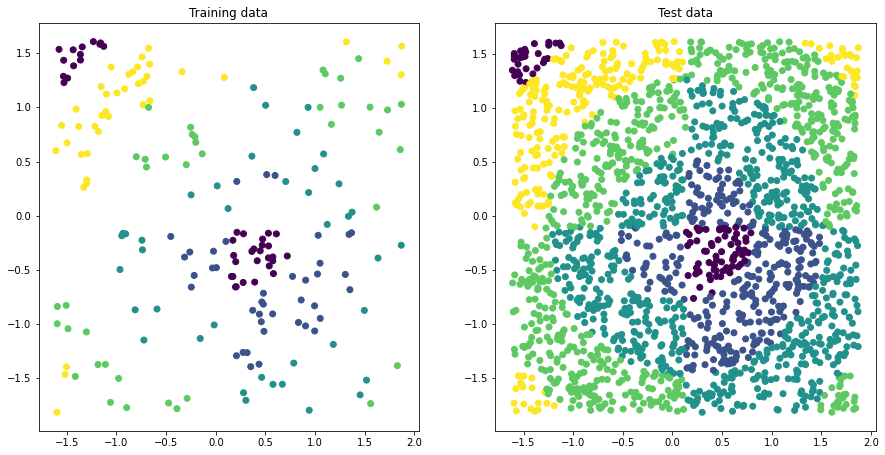

In [1181]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1182]:
L=[8,8]
for Re in ["L1","L2","None"]:
    for W in [0,2,3,4]:
        mlp_test=ML.MLP_new(2,5,L,[ML.tanh]*len(L)+[ML.softmax],[ML.tanh_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        start_time = time.time()
        if W>0:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=1,
                              beta=0.9,max_epoch=MAX_EPOCH,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
        else:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH)
        
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("rings5-sparse-"+str(W)+"-"+str(Re))

        output_layer=mlp_test.calculate(train_input_layer)
        ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
        output_layer=mlp_test.calculate(test_input_layer)
        ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-sparse","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings5-sparse","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 305.57117428162906
end in epoch 300 with error 187.44796614261577
start error 305.57117428162906
end in epoch 7 with error 272.1369657856525
start error 305.57117428162906
end in epoch 26 with error 263.50481005203744
start error 305.57117428162906
end in epoch 27 with error 263.3013964613449
start error 305.57117428162906
end in epoch 300 with error 107.32992450277104
start error 305.57117428162906
end in epoch 27 with error 258.6663192305182
start error 305.57117428162906
end in epoch 300 with error 107.32992450277104
start error 305.57117428162906
end in epoch 300 with error 107.32992450277104
start error 305.57117428162906
end in epoch 300 with error 45.08325279910051
start error 305.57117428162906
end in epoch 19 with error 275.40333664245924
start error 305.57117428162906
end in epoch 300 with error 219.09000895025585
start error 305.57117428162906
end in epoch 300 with error 219.09000895025585


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

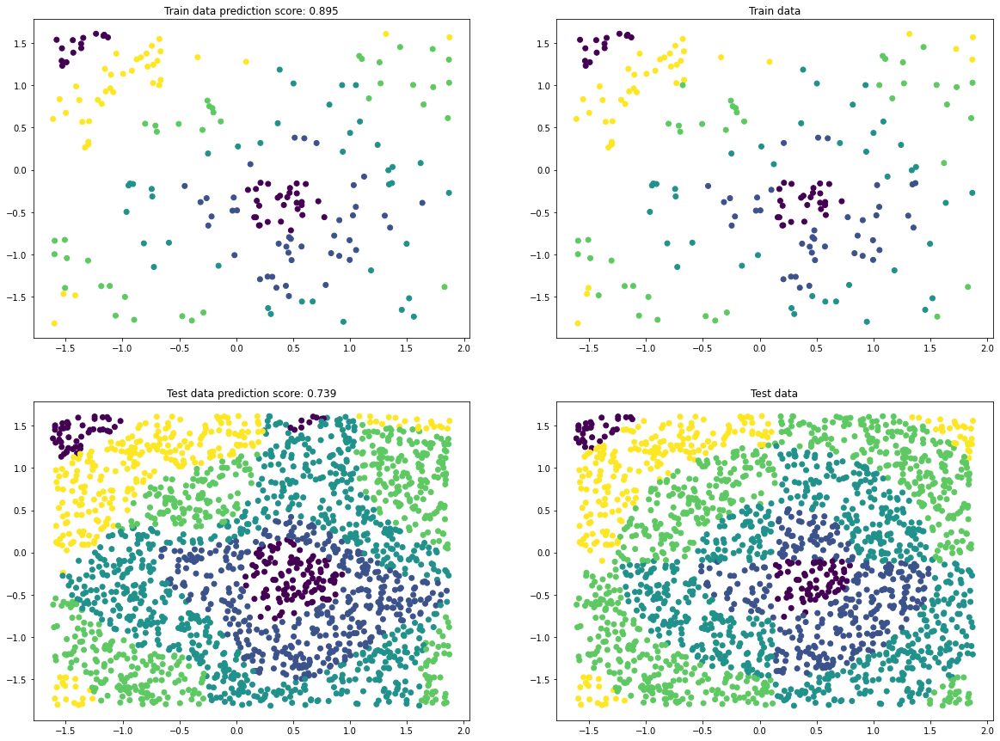

In [1183]:
best=df[df["cost_function"]=="ACC"][-12:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

# rings3-balance

In [1184]:
test = np.loadtxt("mio1/classification/rings3-balance-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1185]:
test = np.loadtxt("mio1/classification/rings3-balance-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

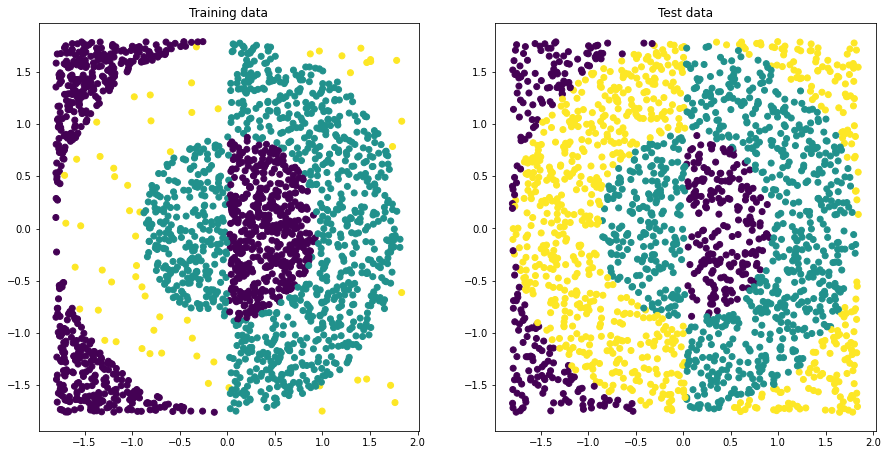

In [1186]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1187]:
L=[8,8]
for Re in ["L1","L2","None"]:
    for W in [0,2,3,4]:
        mlp_test=ML.MLP_new(2,3,L,[ML.tanh]*len(L)+[ML.softmax],[ML.tanh_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        start_time = time.time()
        if W>0:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=1,
                              beta=0.9,max_epoch=MAX_EPOCH,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
        else:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH)
        
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("rings3-balance-"+str(W)+"-"+str(Re))

        output_layer=mlp_test.calculate(train_input_layer)
        ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
        output_layer=mlp_test.calculate(test_input_layer)
        ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-balance","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"rings3-balance","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 2404.521525096415
end in epoch 300 with error 1144.4599118534265
start error 2404.521525096415
end in epoch 6 with error 1482.424392990959
start error 2404.521525096415
end in epoch 7 with error 1436.5297573316666
start error 2404.521525096415
end in epoch 8 with error 1398.750456198176
start error 2404.521525096415
end in epoch 300 with error 543.2781865967843
start error 2404.521525096415
end in epoch 5 with error 1538.3316622911384
start error 2404.521525096415
end in epoch 6 with error 1488.0505715261763
start error 2404.521525096415
end in epoch 7 with error 1443.5521574740887
start error 2404.521525096415
end in epoch 300 with error 271.89070173919777
start error 2404.521525096415
end in epoch 13 with error 1674.7635973674614
start error 2404.521525096415
end in epoch 14 with error 1650.7046259933604
start error 2404.521525096415
end in epoch 15 with error 1629.6241402961668


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

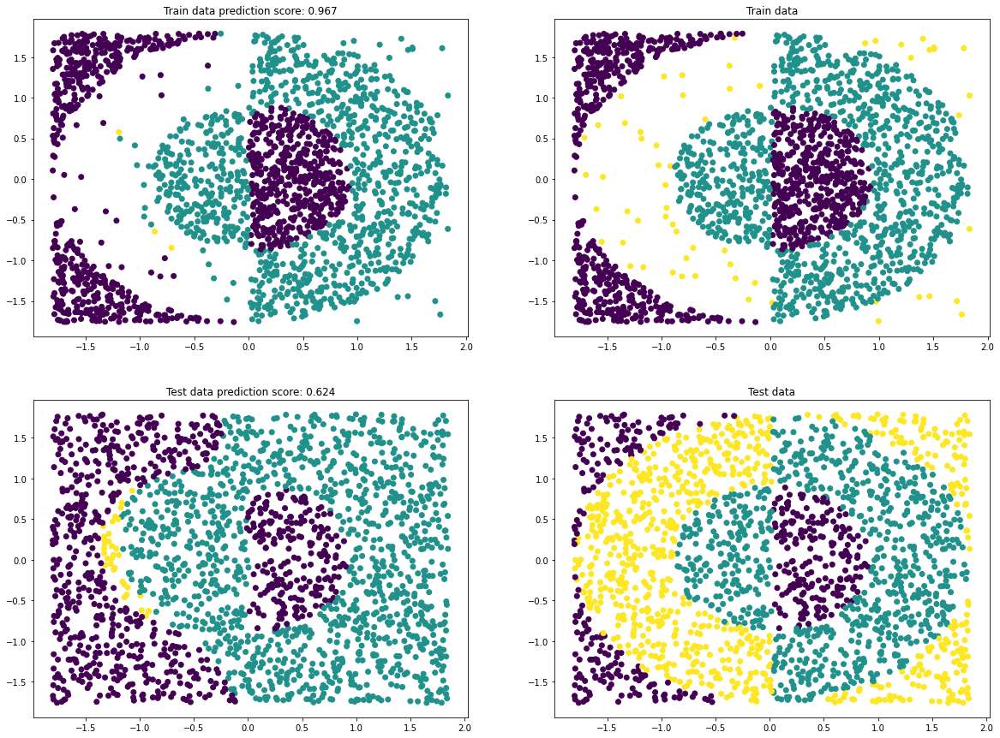

In [1188]:
best=df[df["cost_function"]=="ACC"][-12:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

# xor3-balance

In [1189]:
test = np.loadtxt("mio1/classification/xor3-balance-training.csv", delimiter=',', skiprows=1, usecols=range(0,3))
np.random.shuffle(test)
X=test[:,0:2]
Y=test[:,2:3]
Y=Y==np.unique(Y)
Y=np.array(Y,dtype=int)
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=Y

In [1190]:
test = np.loadtxt("mio1/classification/xor3-balance-test.csv", delimiter=',', skiprows=1, usecols=range(0,3))
X1=test[:,0:2]
Y1=test[:,2:3]
Y1=Y1==np.unique(Y1)
Y1=np.array(Y1,dtype=int)
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=Y1

[Text(0.5, 1.0, 'Test data')]

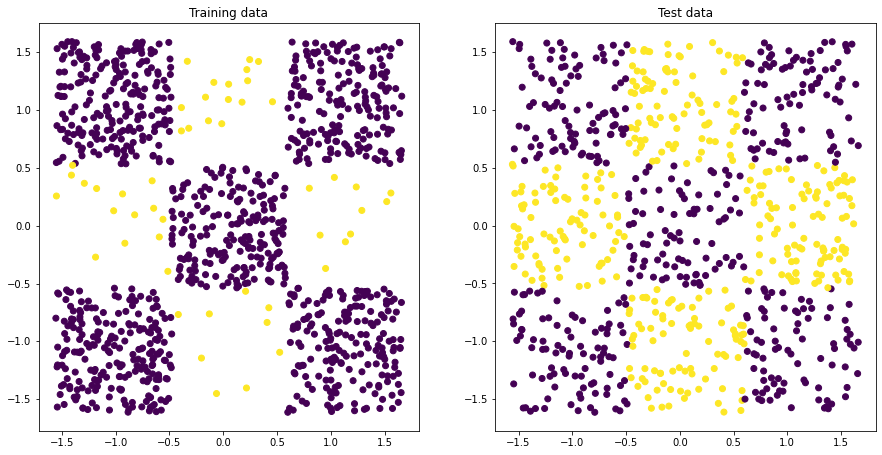

In [1191]:
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax.set(title="Training data")

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax1.set(title="Test data")

In [1192]:
L=[8,8]
for Re in ["L1","L2","None"]:
    for W in [0,2,3,4]:
        mlp_test=ML.MLP_new(2,2,L,[ML.tanh]*len(L)+[ML.softmax],[ML.tanh_grad]*len(L)+[ML.softmax_grad],ML.cross_entropy,ML.cross_entropy_grad)
        start_time = time.time()
        if W>0:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=1,
                              beta=0.9,max_epoch=MAX_EPOCH,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
        else:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH)
        
        
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("xor3-balance-"+str(W)+"-"+str(Re))

        output_layer=mlp_test.calculate(train_input_layer)
        ac_train=np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1))
        output_layer=mlp_test.calculate(test_input_layer)
        ac_test=np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.cross_entropy(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.cross_entropy(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3-balance","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":ac_train,"score_test":ac_test,"cost_function":"ACC",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)
        df=df.append({"model_n":model_n,"problem":"classification","dataset":"xor3-balance","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":score_train,"score_test":score_test,"cost_function":"Entropy",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 730.9285577951914
end in epoch 96 with error 201.32489902765286
start error 730.9285577951914
end in epoch 3 with error 247.67133805975624
start error 730.9285577951914
end in epoch 4 with error 213.82119630345093
start error 730.9285577951914
end in epoch 5 with error 208.34125723636367
start error 730.9285577951914
end in epoch 63 with error 200.89116757662998
start error 730.9285577951914
end in epoch 3 with error 247.02701165925913
start error 730.9285577951914
end in epoch 4 with error 213.55559095197168
start error 730.9285577951914
end in epoch 5 with error 208.69128071088983
start error 730.9285577951914
end in epoch 300 with error 179.7276028437307
start error 730.9285577951914
end in epoch 5 with error 474.7075061534208
start error 730.9285577951914
end in epoch 6 with error 417.24216516777113
start error 730.9285577951914
end in epoch 7 with error 367.95010533583013


## Najlepszy model

[Text(0.5, 1.0, 'Test data')]

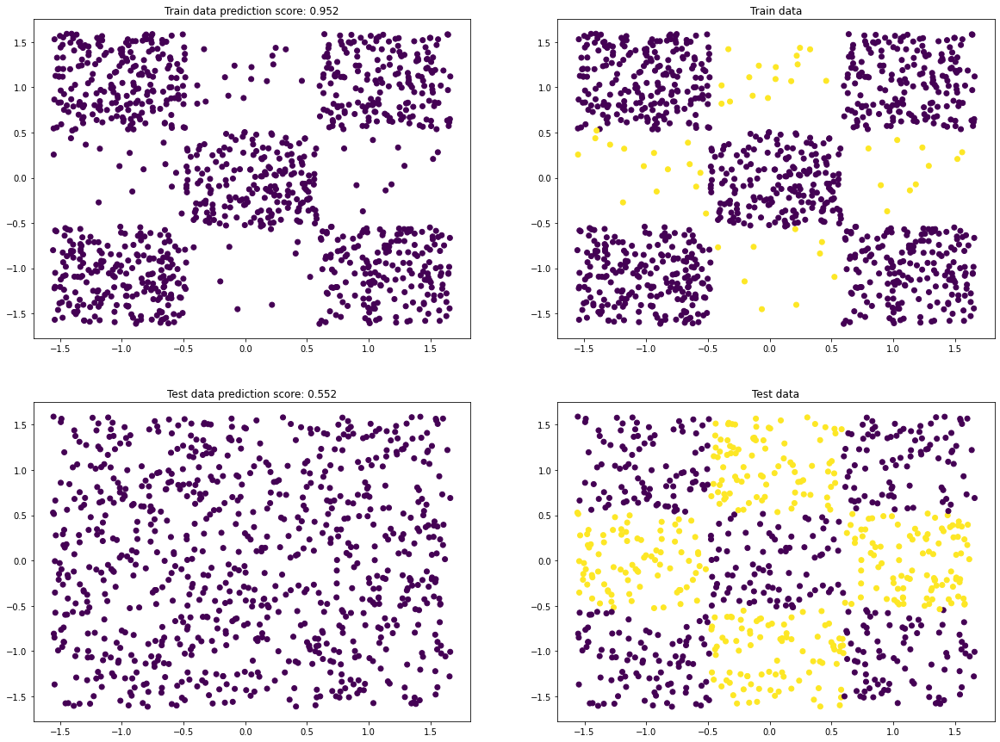

In [1193]:
best=df[df["cost_function"]=="ACC"][-12:].nlargest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(20,15))
ax=fig.add_subplot(221)
ax.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax.set(title='Train data prediction score: '+str(round(np.mean(np.argmax(train_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax1=fig.add_subplot(222)
ax1.scatter(train_input_layer[:,0],train_input_layer[:,1],c=np.argmax(train_output_layer,axis=1))
ax1.set(title="Train data")


output_layer=mlp_test.calculate(test_input_layer)

ax2=fig.add_subplot(223)
ax2.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(output_layer,axis=1))
ax2.set(title='Test data prediction score: '+str(round(np.mean(np.argmax(test_output_layer,axis=1)==np.argmax(output_layer,axis=1)),3)))

ax3=fig.add_subplot(224)
ax3.scatter(test_input_layer[:,0],test_input_layer[:,1],c=np.argmax(test_output_layer,axis=1))
ax3.set(title="Test data")

# multimodal-sparse

In [1194]:
test = np.loadtxt("mio1/regression/multimodal-sparse-training.csv", delimiter=',', skiprows=1, usecols=range(1,3))
np.random.shuffle(test)
X=test[:,0:1]
Y=test[:,1:2]
train_input_layer=(X-np.mean(X,axis=0))/np.std(X,axis=0)
train_output_layer=(Y-np.mean(Y,axis=0))/np.std(Y,axis=0)

In [1195]:
test = np.loadtxt("mio1/regression/multimodal-sparse-test.csv", delimiter=',', skiprows=1, usecols=range(1,3))
X1=test[:,0:1]
Y1=test[:,1:2]
test_input_layer=(X1-np.mean(X,axis=0))/np.std(X,axis=0)
test_output_layer=(Y1-np.mean(Y,axis=0))/np.std(Y,axis=0)

[Text(0.5, 1.0, 'Test Set')]

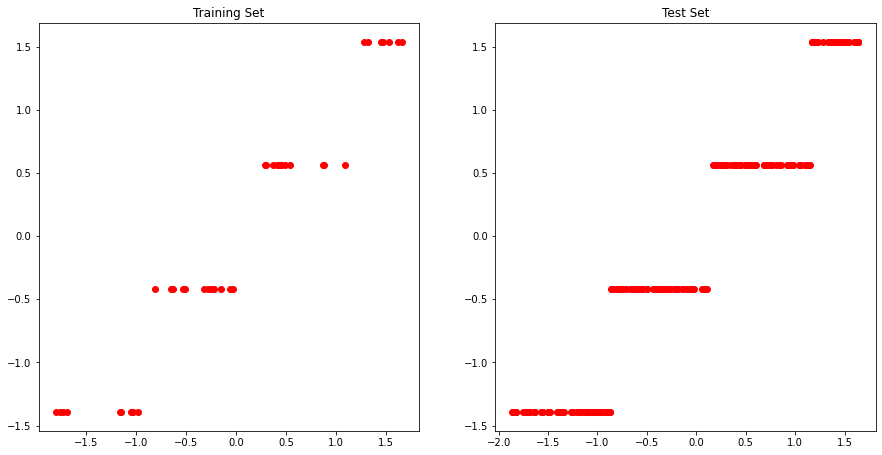

In [1196]:
fig=plt.figure(figsize=(15,7.5))
fig.add_axes()
ax1=fig.add_subplot(121)
ax1.scatter(train_input_layer, train_output_layer, color='r')
ax1.set(title="Training Set")
ax2=fig.add_subplot(122)
ax2.scatter(test_input_layer, test_output_layer, color='r')
ax2.set(title="Test Set")

In [1197]:
L=[8,8]
for Re in ["L1","L2","None"]:
    for W in [0,2,3,4]:
        mlp_test=ML.MLP_new(1,1,L,[ML.tanh]*len(L)+[ML.identity],[ML.tanh_grad]*len(L)+[ML.identity_grad],ML.MSE,ML.MSE_grad)
        start_time = time.time()
        if W>0:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=1,
                              beta=0.9,max_epoch=MAX_EPOCH,validate=True,
                              test_input_layer=test_input_layer,test_output_layer=test_output_layer,early_stop=W)
        else:
            if Re=="L1":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L1=True)
            if Re=="L2":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH,L2=True)
            if Re=="None":
                er=mlp_test.train(train_input_layer,train_output_layer,batch=0.1,
                              beta=0.9,max_epoch=MAX_EPOCH)
        
        
        end_time = time.time()
        t=end_time - start_time

        networks.append(deepcopy(mlp_test))
        networks_err.append(er.copy())
        networks_names.append("multimodal-sparse-"+str(W)+"-"+str(Re))

        output_layer=mlp_test.calculate(train_input_layer)
        score_train=ML.MSE(train_output_layer,output_layer)
        output_layer=mlp_test.calculate(test_input_layer)
        score_test=ML.MSE(test_output_layer,output_layer)

        L1=sum([np.sum(w**2) for w in mlp_test.weights])
        L2=sum([np.sum(np.abs(w)) for w in mlp_test.weights])

        rows_train=train_input_layer.shape[0]
        rows_test=test_input_layer.shape[0]
        columns_input=train_input_layer.shape[1]
        columns_output=train_output_layer.shape[1]
        connections=sum([L[i]*L[i+1] for i in range(len(L)-1)])+columns_input*L[0]+columns_output*L[-1]
        neurons=sum(L)
        L1=L1/connections
        L2=L2/connections
        score_train=score_train/rows_train
        score_test=score_test/rows_test
        t=t/(len(er)-1)
        model_n+=1
        df=df.append({"model_n":model_n,"problem":"regresion","dataset":"multimodal-sparse","columns_input":columns_input,"columns_output":columns_output,
                      "rows_train":rows_train,"rows_test":rows_test,"layers":len(L),"neurons":neurons,"connections":connections,
                      "L1":L1,"L2":L2,"regularization":Re,"alpha":0.01,"activation_function":f,
                             "validate":W,"score_train":score_train,"score_test":score_test,"cost_function":"MSE",
                             "epochs":len(er)-1,"time":t,"rate":0.1,"beta":0.9,"RMSprop":False,"batch":0.1},ignore_index=True)

start error 5.259948129262676
end in epoch 101 with error 2.542248432147132
start error 5.259948129262676
end in epoch 10 with error 2.789084639060892
start error 5.259948129262676
end in epoch 34 with error 2.382220689367837
start error 5.259948129262676
end in epoch 35 with error 2.3912459942294966
start error 5.259948129262676
end in epoch 300 with error 2.2432125107809386
start error 5.259948129262676
end in epoch 73 with error 2.253766549226173
start error 5.259948129262676
end in epoch 74 with error 2.253622803152961
start error 5.259948129262676
end in epoch 75 with error 2.253464996110791
start error 5.259948129262676
end in epoch 300 with error 2.2246472766473886
start error 5.259948129262676
end in epoch 11 with error 2.758552207278059
start error 5.259948129262676
end in epoch 12 with error 2.87523157754999
start error 5.259948129262676
end in epoch 13 with error 2.9800095095709898


[Text(0.5, 1.0, 'Test data score: 0.077')]

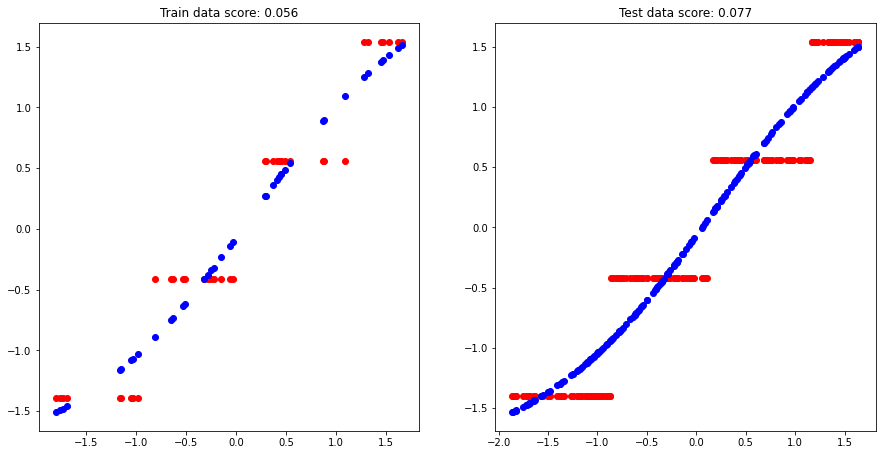

In [1198]:
best=df[df["cost_function"]=="MSE"][-12:].nsmallest(1, 'score_test')["model_n"].values[0]
mlp_test=networks[best-1]

output_layer=mlp_test.calculate(train_input_layer)
fig=plt.figure(figsize=(15,7.5))
ax=fig.add_subplot(121)
ax.scatter(train_input_layer, train_output_layer, color='r')
ax.scatter(train_input_layer,output_layer,color="b")
ax.set(title='Train data score: ' +str(round(ML.MSE(train_output_layer,output_layer)/output_layer.shape[0],3)))

output_layer=mlp_test.calculate(test_input_layer)

ax1=fig.add_subplot(122)
ax1.scatter(test_input_layer, test_output_layer, color='r')
ax1.scatter(test_input_layer,output_layer,color="b")
ax1.set(title='Test data score: ' +str(round(ML.MSE(test_output_layer,output_layer)/output_layer.shape[0],3)))

In [1199]:
df_c=df[df["problem"]=="classification"]

In [1200]:
df_r=df[df["problem"]!="classification"]

In [1201]:
df_c=df_c[-72:]

In [1202]:
df_r=df_r[-12:]

## Wyniki w zależności od walidacji i regularyzacji

## Accuracy

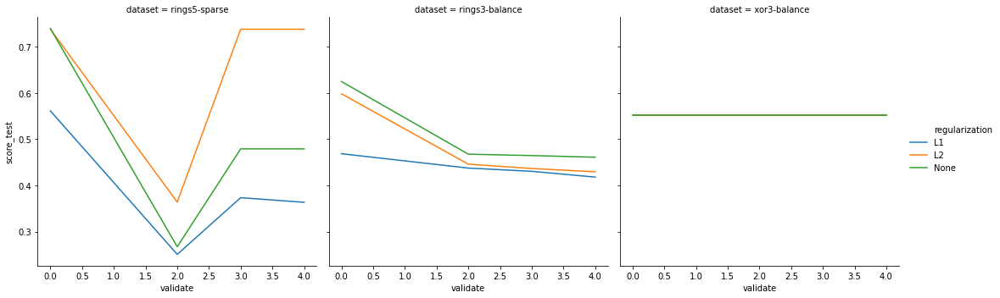

In [1203]:
sns.relplot(x="validate",y="score_test",hue="regularization",col="dataset",kind="line",data=df_c[df_c.cost_function=="ACC"])

## Entropy

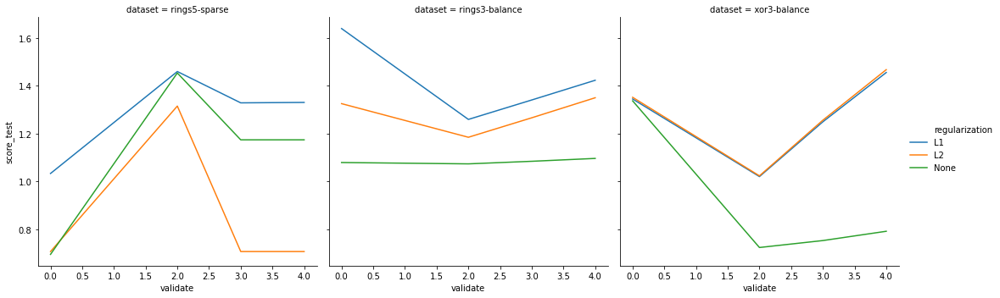

In [1204]:
sns.relplot(x="validate",y="score_test",hue="regularization",col="dataset",kind="line",data=df_c[df_c.cost_function=="Entropy"])

## MSE

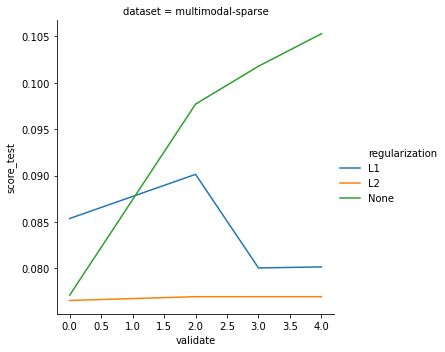

In [1205]:
sns.relplot(x="validate",y="score_test",hue="regularization",col="dataset",kind="line",data=df_r)

Zbyt szybkie zatrzymywanie znacząco pogarsza wynik. Zaś czasami L2 polepszała wynik, a raz pogarszała.

## Wykres błędów ring5-sparse

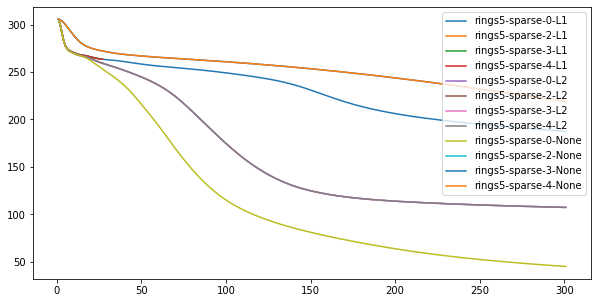

In [1207]:
plt.figure(figsize=(10,5))
for x in range(144,156):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów ring3-balance

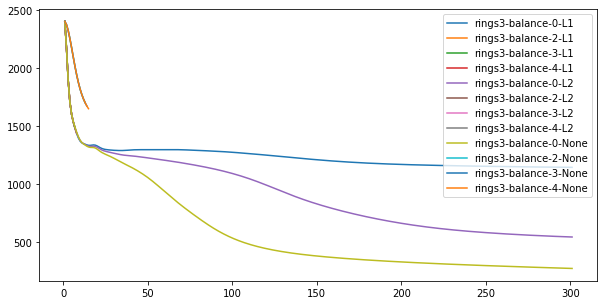

In [1208]:
plt.figure(figsize=(10,5))
for x in range(156,168):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów xor3-balance

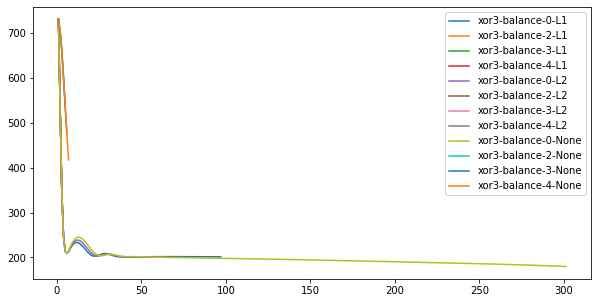

In [1209]:
plt.figure(figsize=(10,5))
for x in range(168,180):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

## Wykres błędów multimodal-sparse

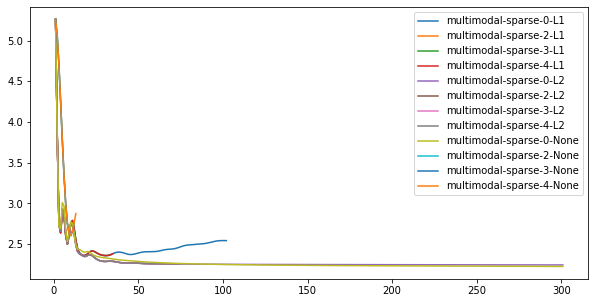

In [1210]:
plt.figure(figsize=(10,5))
for x in range(180,192):
    t=np.arange(1,len(networks_err[x])+1,1)
    if networks_err[x][-1]<10**10:
        plt.plot(t,networks_err[x],label=networks_names[x])
    
plt.legend(loc="upper right")  

Bez regularyzacji szybciej zbiega

## Wykres L2 od regularyzacji i validacji

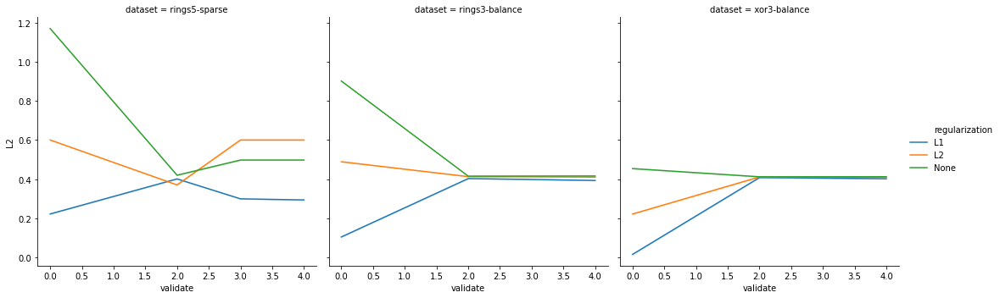

In [1211]:
sns.relplot(x="validate",y="L2",hue="regularization",col="dataset",kind="line",data=df_c)

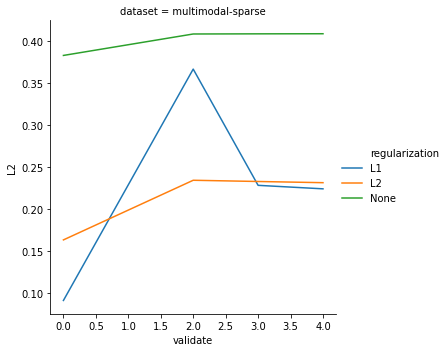

In [1212]:
sns.relplot(x="validate",y="L2",hue="regularization",col="dataset",kind="line",data=df_r)

## Wykres L1 od regularyzacji i validacji

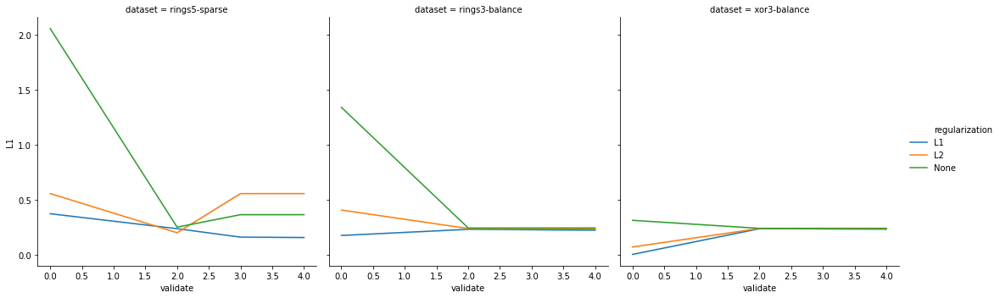

In [1213]:
sns.relplot(x="validate",y="L1",hue="regularization",col="dataset",kind="line",data=df_c)

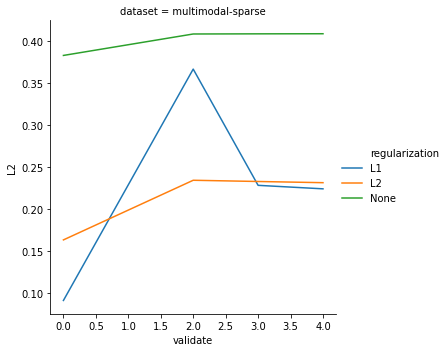

In [1214]:
sns.relplot(x="validate",y="L2",hue="regularization",col="dataset",kind="line",data=df_r)

# Podsumowanie

Regularyzacja działa w sensie zmniejsza wagi, przy czym L1 regularyzacja przy tej samej alphie bardziej L2 regularyzuje niż nawet L2.